# Image Classification

## 📌1.1 Part A: Implementing Convolutional Neural Network from scratch.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Standard libraries
import os
import random
import shutil
import time
from collections import Counter
from PIL import Image, UnidentifiedImageError
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator, image, load_img, img_to_array
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix

### 1.1.1 Data Understanding, Analysis, Visualization and Cleaning

**What does the dataset represent?**


Answer: The dataset is a multi-class image classification dataset which contains images of 5 flower classed. The goal is to classify images into their respective flower categories using a Convolutional Neural Network (CNN). The dataset is taken from the Flowers Recognition dataset on Kaggle, which contains the following classes:

Daisy

Dandelion

Rose

Sunflower

Tulip

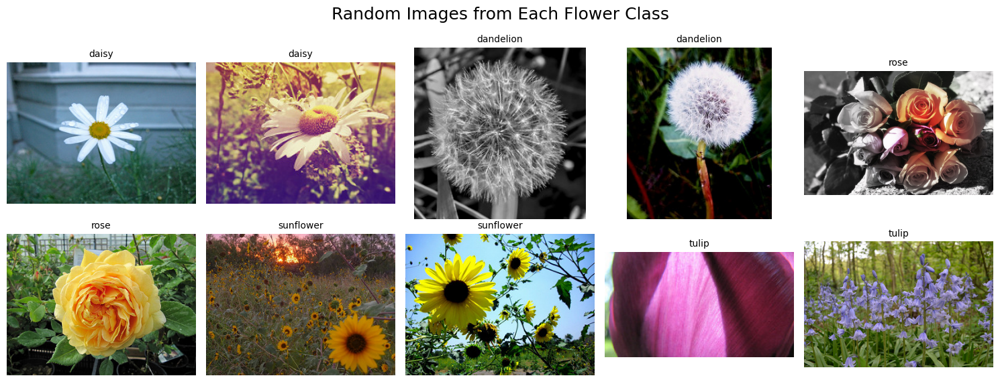

In [ ]:
# data visualization
# load the dataset
dataset_dir = '/content/drive/MyDrive/Artificial Intelligence/Coursework/Task-1/Flower_Classifications/Train'

# List class names (folder names)
class_names = os.listdir(dataset_dir)
class_names.sort()

# 1. Show 2 random images from each class
def show_random_images(dataset_dir, class_names, images_per_class=2):
    plt.figure(figsize=(15, 6))  # Adjust figure size for 2x5 gridv

    for i, class_name in enumerate(class_names):
        class_path = os.path.join(dataset_dir, class_name)
        image_files = os.listdir(class_path)
        sample_files = random.sample(image_files, images_per_class)

        for j, img_file in enumerate(sample_files):
            img_path = os.path.join(class_path, img_file)
            image = Image.open(img_path)

            # Calculate subplot index for 2x5 grid
            subplot_index = i * images_per_class + j + 1

            plt.subplot(images_per_class, len(class_names), subplot_index)  # 2 rows, 5 columns
            plt.imshow(image)
            plt.title(class_name, fontsize=10)  # Adjust title font size if needed
            plt.axis('off')

    plt.suptitle('Random Images from Each Flower Class', fontsize=18)
    plt.tight_layout()
    plt.show()

show_random_images(dataset_dir, class_names)

**How many total images are in the dataset?**

There are totla of 4312 images in the dataset.

In [ ]:
# count the total number of images
class_names = sorted(os.listdir(dataset_dir))
class_counts = {cls: len(os.listdir(os.path.join(dataset_dir, cls))) for cls in class_names}
total_images = sum(class_counts.values())

print(f"Total Images: {total_images}")

Total Images: 4312


**• What is the distribution of images across different classes?**

There are around 700 images per class. The exact number of images is listed below.

Training Class Distribution:
{'daisy': 763, 'dandelion': 1051, 'rose': 783, 'sunflower': 732, 'tulip': 983}


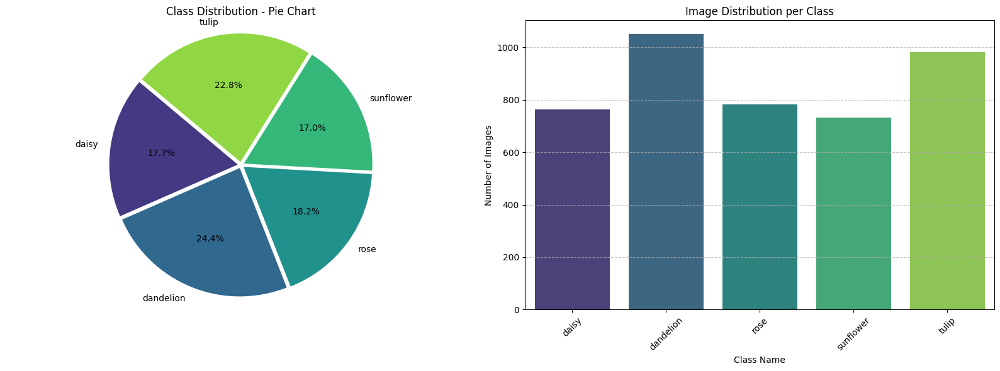

In [ ]:
# Get class distribution
print(f'Training Class Distribution:\n{class_counts}')

class_labels = list(class_counts.keys())
class_values = list(class_counts.values())

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ✅ Pie Chart
axes[0].pie(
    class_values,
    labels=class_labels,
    autopct='%1.1f%%',
    startangle=140,
    explode=(0.025,0.025,0.025,0.025,0.025),
    colors=sns.color_palette('viridis', len(class_counts))
)
axes[0].set_title('Class Distribution - Pie Chart')
axes[0].axis('equal')

# ✅ Vertical Bar Plot (fixing palette warning)
sns.barplot(
    x=class_labels,
    y=class_values,
    hue=class_labels,  # Fix: Explicitly set hue to x variable
    palette='viridis',
    legend=False,
    ax=axes[1]
)
axes[1].set_xlabel('Class Name')
axes[1].set_ylabel('Number of Images')
axes[1].set_title('Image Distribution per Class')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

In [ ]:
# 2. Data Cleaning (Data pre-processing)

# List all class directories
class_dirs = [d for d in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, d))]

corrupted_images = []  # List to store corrupted image paths
corrupted_count = 0    # Counter for corrupted images

# Iterate through each class subdirectory
for class_dir in class_dirs:
    class_path = os.path.join(dataset_dir, class_dir)

    # List all image files in the directory
    images = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    for image in images:
        image_path = os.path.join(class_path, image)

        try:
            # Attempt to open and verify the image
            with Image.open(image_path) as img:
                img.verify()  # Verify the image integrity

        except (IOError, SyntaxError, UnidentifiedImageError):
            # If an error occurs, consider it a corrupted image
            corrupted_images.append(image_path)
            corrupted_count += 1
            try:
                os.remove(image_path)
                print(f"Removed corrupted image: {image_path}")
            except Exception as e:
                print(f"Could not remove {image_path} due to error: {e}")

# Final report
if corrupted_count == 0:
    print("No Corrupted Images Found.")
else:
    print(f"\nTotal Corrupted Images Removed: {corrupted_count}")

Removed corrupted image: /content/drive/MyDrive/Flower_Classifications/Train/dandelion/34323645656_afd53a9996_n.jpg
Removed corrupted image: /content/drive/MyDrive/Flower_Classifications/Train/dandelion/34729107795_c746845e17_n.jpg
Removed corrupted image: /content/drive/MyDrive/Flower_Classifications/Train/dandelion/17075803866_aeeded2637.jpg
Removed corrupted image: /content/drive/MyDrive/Flower_Classifications/Train/dandelion/2995221296_a6ddaccc39.jpg
Removed corrupted image: /content/drive/MyDrive/Flower_Classifications/Train/dandelion/468749497_951c571eff_n.jpg
Removed corrupted image: /content/drive/MyDrive/Flower_Classifications/Train/dandelion/10919961_0af657c4e8.jpg
Removed corrupted image: /content/drive/MyDrive/Flower_Classifications/Train/dandelion/7015947703_11b30c20c9_n.jpg
Removed corrupted image: /content/drive/MyDrive/Flower_Classifications/Train/daisy/33884228533_91b75ff4d4_n.jpg
Removed corrupted image: /content/drive/MyDrive/Flower_Classifications/Train/daisy/456305

Total Images: 4277
Training Class Distribution:
{'daisy': 756, 'dandelion': 1044, 'rose': 776, 'sunflower': 725, 'tulip': 976}


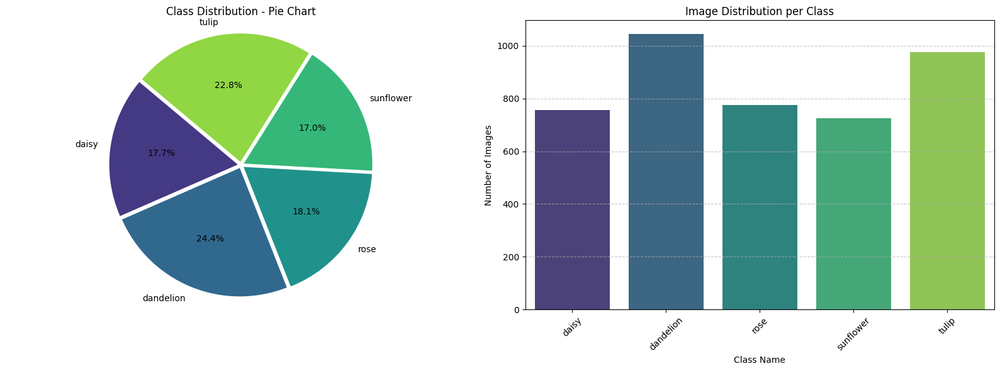

In [ ]:
# images count after removing corrupt images
import matplotlib.pyplot as plt
import seaborn as sns

# count the total number of images after data cleaning
class_names = sorted(os.listdir(dataset_dir))
class_counts = {cls: len(os.listdir(os.path.join(dataset_dir, cls))) for cls in class_names}
total_images = sum(class_counts.values())

print(f"Total Images: {total_images}")

# # Get class distribution
print(f'Training Class Distribution:\n{class_counts}')

# class_names, class_counts = get_class_distribution(dataset_dir)
class_labels = list(class_counts.keys())
class_values = list(class_counts.values())

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ✅ Pie Chart
axes[0].pie(
    class_values,
    labels=class_labels,
    autopct='%1.1f%%',
    startangle=140,
    explode=(0.025,0.025,0.025,0.025,0.025),
    colors=sns.color_palette('viridis', len(class_counts))
)
axes[0].set_title('Class Distribution - Pie Chart')
axes[0].axis('equal')

# ✅ Vertical Bar Plot (fixing palette warning)
sns.barplot(
    x=class_labels,
    y=class_values,
    hue=class_labels,  # Fix: Explicitly set hue to x variable
    palette='viridis',
    legend=False,
    ax=axes[1]
)
axes[1].set_xlabel('Class Name')
axes[1].set_ylabel('Number of Images')
axes[1].set_title('Image Distribution per Class')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


**How is the dataset split into training and validation sets? Justify your choice.**

The dataset is split into 70% training data, 15% validation data and another 15% test data.

* To preserve the class distribution across the splits, each class folder inside the main datasets are processed independently and is randomly shuffled using random.seed(40).

* As it is necessary to train the model with larger portion of the data, 70% was splited for training ad it helps to learn the partern effectively and generalize it well. To ensure the model does not overfit to the training data, 15% portion of the data is splited for validation. This is used during model training for tuning the hyperparameters. And 15% is seperated for testing to use it during the model evaluation, to see the unseen data generalization of the model. Each classes are handled and processed individualltm to create balanced class split to avoid bais in the classification task.

In [ ]:
random.seed(42)  # Set seed for reproducibility
# Define the paths for the original dataset and the split dataset
dataset_dir = "/content/drive/MyDrive/Flower_Classifications/Train"
split_dir = "/content/drive/MyDrive/Flower_Classifications//Data_split"
# Create the split directory if it doesn't exist
os.makedirs(split_dir, exist_ok=True)
# Define the ratios for train, validation, and test sets
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15
# Create directories for train, validation, and test sets
train_dir = os.path.join(split_dir, "train")
val_dir = os.path.join(split_dir, "val")
test_dir = os.path.join(split_dir, "test")
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)
# Iterate over each class directory in the original dataset directory
for class_name in os.listdir(dataset_dir):
    class_dir = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_dir):
# Get the list of image files in the class directory and shuffle them
        image_files = [f for f in os.listdir(class_dir) if f.endswith(".jpg") or f.endswith(".png")]
        random.shuffle(image_files)
        num_images = len(image_files)
        num_train = int(num_images * train_ratio)
        num_val = int(num_images * val_ratio)
        num_test = num_images - num_train - num_val
        # Split the image files into train, validation, and test sets
        train_images = image_files[:num_train]
        val_images = image_files[num_train:num_train + num_val]
        test_images = image_files[num_train + num_val:]
 # Copy train set images to the train directory
        for img in train_images:
            src = os.path.join(class_dir, img)
            dst = os.path.join(train_dir, class_name, img)  # Adjusted destination directory
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.copy(src, dst)
# Copy validation set images to the validation directory
        for img in val_images:
            src = os.path.join(class_dir, img)
            dst = os.path.join(val_dir, class_name, img)  # Adjusted destination directory
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.copy(src, dst)
 # Copy test set images to the test directory
        for img in test_images:
            src = os.path.join(class_dir, img)
            dst = os.path.join(test_dir, class_name, img)  # Adjusted destination directory
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.copy(src, dst)
print("Dataset split into train, validation, and test sets successfully.")

Dataset split into train, validation, and test sets successfully.


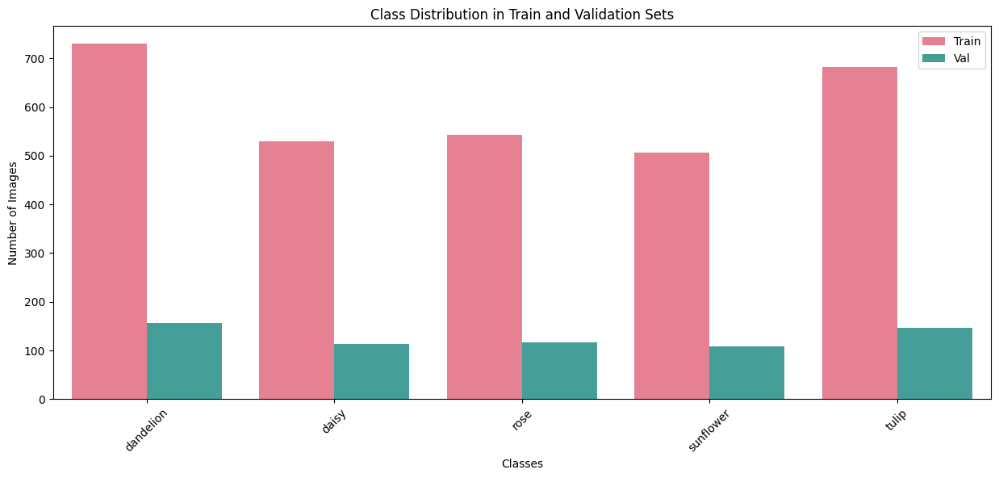

In [ ]:
train_dir = "/content/drive/MyDrive/Flower_Classifications/Data_split/train"
val_dir = "/content/drive/MyDrive/Flower_Classifications/Data_split/val"


# Calculate the number of images for each class in the train and validation sets
train_class_counts = {class_name: len(os.listdir(os.path.join(train_dir, class_name))) for class_name in os.listdir(train_dir)}
val_class_counts = {class_name: len(os.listdir(os.path.join(val_dir, class_name))) for class_name in os.listdir(val_dir)}

# Plot a bar chart to visualize the class distribution in train and validation sets
plt.figure(figsize=(15, 6))  # Set the figure size
sns.barplot(x=list(train_class_counts.keys()) + list(val_class_counts.keys()),
            y=list(train_class_counts.values()) + list(val_class_counts.values()),
            hue=['Train'] * len(train_class_counts) + ['Val'] * len(val_class_counts),
            palette=sns.color_palette("husl", 2))
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('Class Distribution in Train and Validation Sets')
plt.xticks(rotation=45)
plt.legend()
plt.show()

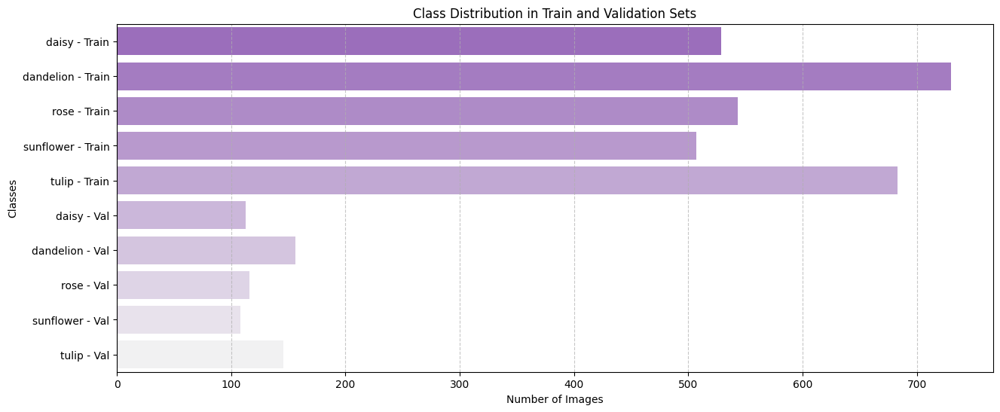

In [ ]:
classes = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']

# Count the number of images for each class in the train and validation directories
train_counts = {class_name: len(os.listdir(os.path.join(train_dir, class_name))) for class_name in classes}
val_counts = {class_name: len(os.listdir(os.path.join(val_dir, class_name))) for class_name in classes}

# Extract counts and labels for train and validation sets
train_counts_values = [train_counts[class_name] for class_name in classes]
val_counts_values = [val_counts[class_name] for class_name in classes]

train_labels = [f'{cls} - Train' for cls in classes]
val_labels = [f'{cls} - Val' for cls in classes]

# Concatenate counts and labels for train and validation sets
counts = train_counts_values + val_counts_values
labels = train_labels + val_labels

# Plot a horizontal bar chart to visualize the class distribution in train and validation sets
plt.figure(figsize=(15, 6))
sns.barplot(x=counts, y=labels, palette=sns.light_palette("#9D61C8", reverse=True, n_colors=len(labels)), hue=labels)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.xlabel('Number of Images')
plt.ylabel('Classes')
plt.title('Class Distribution in Train and Validation Sets')
plt.show()

In [ ]:
test_dir = "/content/drive/MyDrive/Flower_Classifications/Data_split/test"


def count_images_per_class(directory):
    class_counts = {}
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            count = len(os.listdir(class_path))
            class_counts[class_name] = count
    return class_counts

print("Train Set Class Distribution:\n", count_images_per_class(train_dir))
print("Val Set Class Distribution:\n", count_images_per_class(val_dir))
print("Test Set Class Distribution:\n", count_images_per_class(test_dir))


Train Set Class Distribution:
 {'dandelion': 730, 'daisy': 529, 'rose': 543, 'sunflower': 507, 'tulip': 683}
Val Set Class Distribution:
 {'dandelion': 156, 'daisy': 113, 'rose': 116, 'sunflower': 108, 'tulip': 146}
Test Set Class Distribution:
 {'dandelion': 158, 'daisy': 114, 'rose': 117, 'sunflower': 110, 'tulip': 147}


**What preprocessing techniques (e.g., resizing, normalization) were applied?**



1. **Image Cleaning:**
Removed corrupted images using PIL.Image.verify().

2. **Image Resizing:**
All images are resized to 224x224 pixels.

3. **Normalization:**
Pixel values are rescaled from [0, 255] to [0, 1] using rescale=1./255 in ImageDataGenerator.





**What data generators, if any, were used for preprocessing and augmentation?**

ImageDataGenerator was used from Keras with different settings:

**For Training (train_gen):**

* Augmentation applied

* Normalization

* Image shuffling

**For Validation and Testing (val_gen, test_gen):**

* Only normalization applied

* No augmentation

* Testing generator has shuffle=False for consistent evaluation

In [ ]:
#main part of data pre - processing

train_datagen = ImageDataGenerator(
    rescale=1./255,          #normalize the pixel vlaue [0, 255] to 0 to 1 scale, Divided pixel values [0,255] goes to [0,1] scale
    rotation_range=20,       # image rotation
    width_shift_range=0.1,   #Shift image horizontally by 15% randomly
    height_shift_range=0.1,  #Shift image vertically by 15% randomly
    shear_range=0.1,  #slant the image
    zoom_range=0.1, #zoom the image by 20%
    horizontal_flip=True, #Fliphorizontally
    vertical_flip=True, #Flipvertically
    fill_mode='nearest' #After transformation, fill missing pixels with nearest pixel values
)

train_gen = train_datagen.flow_from_directory( ####esma augmentation garekocha
    train_dir,
    target_size=(224, 224), #resize image to 224 by 224, standard input
    batch_size=32,
    class_mode='sparse',
    shuffle = True
)

val_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse'
)

test_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    shuffle = False,
    class_mode='sparse'
)

Found 2992 images belonging to 5 classes.
Found 639 images belonging to 5 classes.
Found 646 images belonging to 5 classes.


**If data augmentation was applied, provide visualizations of sample augmented images.**

Here is some sample of augmented images.

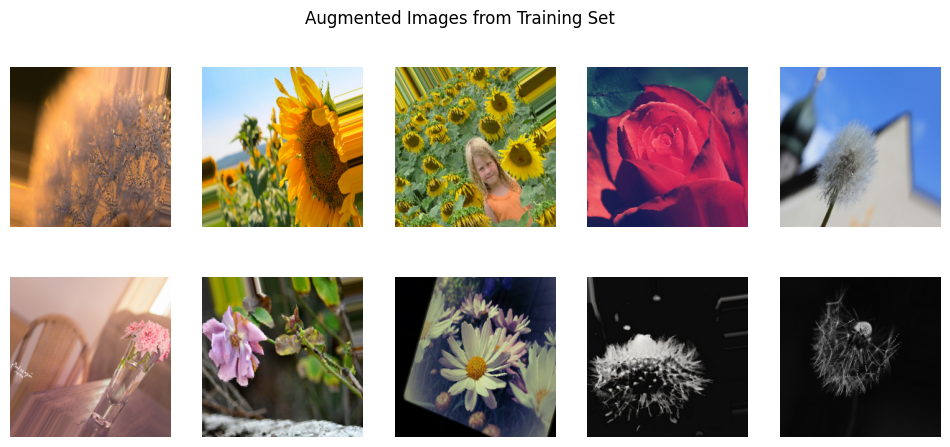

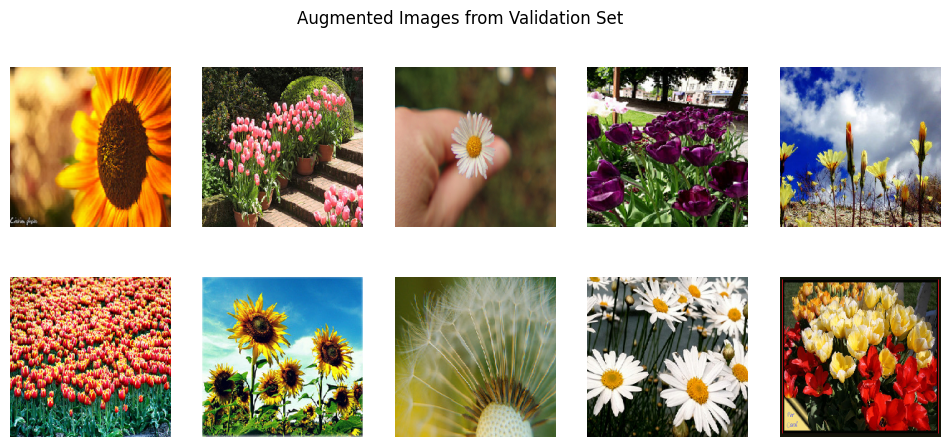

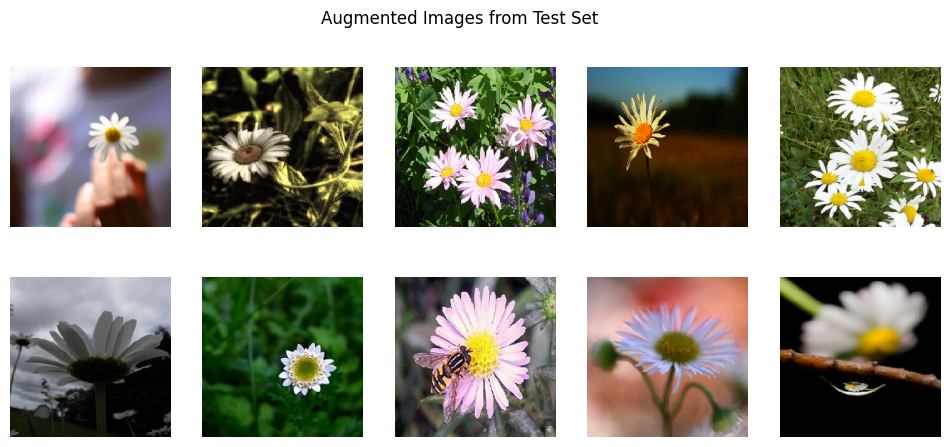

In [ ]:
# Retrieve a batch of augmented images from the training generator
train_batch, _ = next(train_gen)

# Retrieve a batch of augmented images from the validation generator
val_batch, _ = next(val_gen)

# Retrieve a batch of augmented images from the test generator
test_batch, _ = next(test_gen)


# Plot augmented images from the training set
plt.figure(figsize=(12, 5))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(train_batch[i])
    plt.axis('off')
plt.suptitle('Augmented Images from Training Set')
plt.show()

# Plot augmented images from the validation set
plt.figure(figsize=(12, 5))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(val_batch[i])
    plt.axis('off')
plt.suptitle('Augmented Images from Validation Set')
plt.show()


# Plot augmented images from the test set
plt.figure(figsize=(12, 5))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(test_batch[i])
    plt.axis('off')
plt.suptitle('Augmented Images from Test Set')
plt.show()


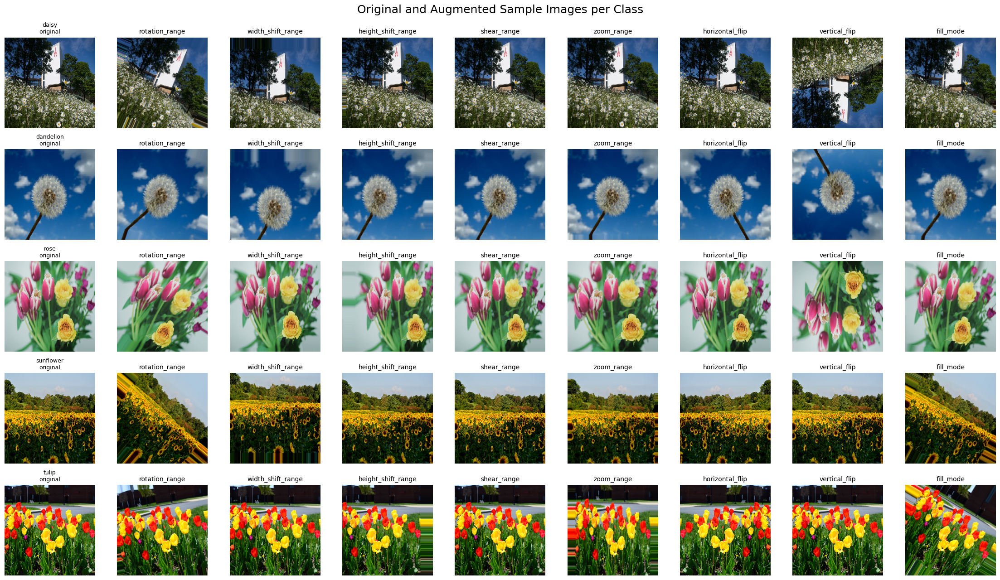

In [ ]:
# Define individual augmentation configurations
augmentation_configs = {
    'rotation_range': ImageDataGenerator(rotation_range=40),
    'width_shift_range': ImageDataGenerator(width_shift_range=0.15),
    'height_shift_range': ImageDataGenerator(height_shift_range=0.15),
    'shear_range': ImageDataGenerator(shear_range=0.2),
    'zoom_range': ImageDataGenerator(zoom_range=0.2),
    'horizontal_flip': ImageDataGenerator(horizontal_flip=True),
    'vertical_flip': ImageDataGenerator(vertical_flip=True),
    'fill_mode': ImageDataGenerator(rotation_range=40, fill_mode='nearest')
}

# Define image size for resizing
img_height, img_width = 224, 224

# Get all class names
class_names = sorted([d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))])

# Number of augmentations to show
n_augmentations = len(augmentation_configs)
total_columns = n_augmentations + 1  # +1 for original image

# Plotting
fig, axes = plt.subplots(len(class_names), total_columns, figsize=(total_columns * 2.5, len(class_names) * 2.5))

for i, class_name in enumerate(class_names):
    class_path = os.path.join(train_dir, class_name)

    # Randomly select an image from the class directory
    image_files = os.listdir(class_path)
    sample_image_path = os.path.join(class_path, random.choice(image_files))

    # Load and preprocess image
    img = load_img(sample_image_path, target_size=(img_height, img_width))
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)

    # Show original image in first column
    ax = axes[i][0]
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'{class_name}\noriginal', fontsize=9)
    ax.set_ylabel(class_name, fontsize=10, rotation=0, labelpad=50, va='center')

    # Show augmented images in the rest of the columns
    for j, (aug_name, datagen) in enumerate(augmentation_configs.items()):
        aug_iter = datagen.flow(x, batch_size=1)
        aug_img = next(aug_iter)[0].astype('uint8')

        ax = axes[i][j + 1]  # +1 to shift past original
        ax.imshow(aug_img)
        ax.axis('off')
        ax.set_title(aug_name, fontsize=10)

# Final formatting
plt.tight_layout()
plt.suptitle('Original and Augmented Sample Images per Class', y=1.02, fontsize=18)
plt.show()

### 1.1.2 Design, Train, and Evaluate a Baseline Model

#### 1. Model Architecture: Building a baseline CNN model.

In [ ]:
def build_baseline_model(input_shape=(224, 224, 3), num_classes=5):
    model = models.Sequential()
     # Add Input layer explicitly
    model.add(layers.Input(shape=input_shape))

    # 1st Convolutional Layer
    model.add(layers.Conv2D(32, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # 2nd Convolutional Layer
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # 3rd Convolutional Layer
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flatten
    model.add(layers.Flatten())

    # Fully Connected Layers
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(32, activation='relu'))

    # Output Layer
    model.add(layers.Dense(num_classes, activation='softmax')) #multi-class classification

    # Compile the model
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# Use the function to create and summarize the model
model = build_baseline_model()
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           165 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,179,461 (42.65 MB)

 Trainable params: 11,179,461 (42.65 MB)

 Non-trainable params: 0 (0.00 B)

#### 2. Model Training

In [ ]:
# Record start time
start_time = time.time()
# Define callbacks
checkpoint_cb = ModelCheckpoint(
    'baseline_model.h5',
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
  )

earlystop_cb = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
  )

# Train the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[checkpoint_cb, earlystop_cb],
    verbose=1
)
# Record end time
end_time = time.time()

# Calculate and display training time
training_time = end_time - start_time
print(f"Training Time: {training_time / 60:.2f} minutes")

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.3321 - loss: 1.4965
Epoch 1: val_loss improved from inf to 1.40160, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 64s 602ms/step - accuracy: 0.3328 - loss: 1.4950 - val_accuracy: 0.4038 - val_loss: 1.4016
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step - accuracy: 0.5141 - loss: 1.1662
Epoch 2: val_loss improved from 1.40160 to 1.08308, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 550ms/step - accuracy: 0.5142 - loss: 1.1661 - val_accuracy: 0.5603 - val_loss: 1.0831
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step - accuracy: 0.5491 - loss: 1.1054
Epoch 3: val_loss improved from 1.08308 to 1.00169, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 49s 524ms/step - accuracy: 0.5494 - loss: 1.1050 - val_accuracy: 0.6119 - val_loss: 1.0017
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step - accuracy: 0.6095 - loss: 1.0050
Epoch 4: val_loss improved from 1.00169 to 0.91550, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 522ms/step - accuracy: 0.6096 - loss: 1.0046 - val_accuracy: 0.6448 - val_loss: 0.9155
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 501ms/step - accuracy: 0.6507 - loss: 0.8964
Epoch 5: val_loss did not improve from 0.91550
94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 532ms/step - accuracy: 0.6506 - loss: 0.8965 - val_accuracy: 0.6119 - val_loss: 1.0610
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step - accuracy: 0.6600 - loss: 0.8756
Epoch 6: val_loss improved from 0.91550 to 0.87634, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 49s 522ms/step - accuracy: 0.6600 - loss: 0.8755 - val_accuracy: 0.6651 - val_loss: 0.8763
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step - accuracy: 0.6733 - loss: 0.8174
Epoch 7: val_loss did not improve from 0.87634
94/94 ━━━━━━━━━━━━━━━━━━━━ 49s 515ms/step - accuracy: 0.6733 - loss: 0.8175 - val_accuracy: 0.6448 - val_loss: 0.8904
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step - accuracy: 0.6888 - loss: 0.8033
Epoch 8: val_loss improved from 0.87634 to 0.80619, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 532ms/step - accuracy: 0.6888 - loss: 0.8033 - val_accuracy: 0.6980 - val_loss: 0.8062
Epoch 9/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step - accuracy: 0.7000 - loss: 0.7668
Epoch 9: val_loss did not improve from 0.80619
94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 529ms/step - accuracy: 0.7000 - loss: 0.7667 - val_accuracy: 0.6870 - val_loss: 0.8423
Epoch 10/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step - accuracy: 0.7137 - loss: 0.7414
Epoch 10: val_loss improved from 0.80619 to 0.74287, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 533ms/step - accuracy: 0.7136 - loss: 0.7415 - val_accuracy: 0.7136 - val_loss: 0.7429
Epoch 11/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step - accuracy: 0.7013 - loss: 0.7461
Epoch 11: val_loss did not improve from 0.74287
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 551ms/step - accuracy: 0.7014 - loss: 0.7461 - val_accuracy: 0.7121 - val_loss: 0.7777
Epoch 12/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step - accuracy: 0.7311 - loss: 0.6961
Epoch 12: val_loss did not improve from 0.74287
94/94 ━━━━━━━━━━━━━━━━━━━━ 49s 521ms/step - accuracy: 0.7311 - loss: 0.6961 - val_accuracy: 0.7246 - val_loss: 0.7517
Epoch 13/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step - accuracy: 0.7280 - loss: 0.7082
Epoch 13: val_loss improved from 0.74287 to 0.74287, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 535ms/step - accuracy: 0.7280 - loss: 0.7080 - val_accuracy: 0.7308 - val_loss: 0.7429
Epoch 14/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step - accuracy: 0.7261 - loss: 0.7101
Epoch 14: val_loss did not improve from 0.74287
94/94 ━━━━━━━━━━━━━━━━━━━━ 83s 548ms/step - accuracy: 0.7260 - loss: 0.7102 - val_accuracy: 0.7105 - val_loss: 0.7580
Epoch 15/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step - accuracy: 0.7580 - loss: 0.6415
Epoch 15: val_loss improved from 0.74287 to 0.71510, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 556ms/step - accuracy: 0.7579 - loss: 0.6418 - val_accuracy: 0.7293 - val_loss: 0.7151
Epoch 16/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step - accuracy: 0.7389 - loss: 0.6558
Epoch 16: val_loss improved from 0.71510 to 0.69831, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 80s 533ms/step - accuracy: 0.7390 - loss: 0.6557 - val_accuracy: 0.7340 - val_loss: 0.6983
Epoch 17/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step - accuracy: 0.7521 - loss: 0.6499
Epoch 17: val_loss did not improve from 0.69831
94/94 ━━━━━━━━━━━━━━━━━━━━ 49s 519ms/step - accuracy: 0.7521 - loss: 0.6499 - val_accuracy: 0.7559 - val_loss: 0.7045
Epoch 18/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step - accuracy: 0.7791 - loss: 0.5868
Epoch 18: val_loss improved from 0.69831 to 0.67560, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 527ms/step - accuracy: 0.7790 - loss: 0.5870 - val_accuracy: 0.7653 - val_loss: 0.6756
Epoch 19/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 502ms/step - accuracy: 0.7851 - loss: 0.5818
Epoch 19: val_loss did not improve from 0.67560
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 535ms/step - accuracy: 0.7848 - loss: 0.5822 - val_accuracy: 0.7230 - val_loss: 0.7125
Epoch 20/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step - accuracy: 0.7644 - loss: 0.6099
Epoch 20: val_loss improved from 0.67560 to 0.67374, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 551ms/step - accuracy: 0.7645 - loss: 0.6097 - val_accuracy: 0.7480 - val_loss: 0.6737
Epoch 21/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step - accuracy: 0.7728 - loss: 0.5846
Epoch 21: val_loss improved from 0.67374 to 0.66157, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 51s 534ms/step - accuracy: 0.7727 - loss: 0.5849 - val_accuracy: 0.7684 - val_loss: 0.6616
Epoch 22/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 503ms/step - accuracy: 0.7826 - loss: 0.5748
Epoch 22: val_loss did not improve from 0.66157
94/94 ━━━━━━━━━━━━━━━━━━━━ 81s 534ms/step - accuracy: 0.7826 - loss: 0.5748 - val_accuracy: 0.7449 - val_loss: 0.7219
Epoch 23/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step - accuracy: 0.7921 - loss: 0.5467
Epoch 23: val_loss improved from 0.66157 to 0.64028, saving model to baseline_model.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 533ms/step - accuracy: 0.7919 - loss: 0.5471 - val_accuracy: 0.7793 - val_loss: 0.6403
Epoch 24/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step - accuracy: 0.7823 - loss: 0.5629
Epoch 24: val_loss did not improve from 0.64028
94/94 ━━━━━━━━━━━━━━━━━━━━ 49s 525ms/step - accuracy: 0.7823 - loss: 0.5630 - val_accuracy: 0.7825 - val_loss: 0.6467
Epoch 25/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 501ms/step - accuracy: 0.7950 - loss: 0.5333
Epoch 25: val_loss did not improve from 0.64028
94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 532ms/step - accuracy: 0.7951 - loss: 0.5333 - val_accuracy: 0.7700 - val_loss: 0.7354
Epoch 26/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step - accuracy: 0.8007 - loss: 0.5172
Epoch 26: val_loss did not improve from 0.64028
94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 531ms/step - accuracy: 0.8007 - loss: 0.5173 - val_accuracy: 0.7559 - val_loss: 0.6931
Epoch 27/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step - accuracy: 0.8208 - loss: 0.4735
Epoch 27: val_loss did not improve f

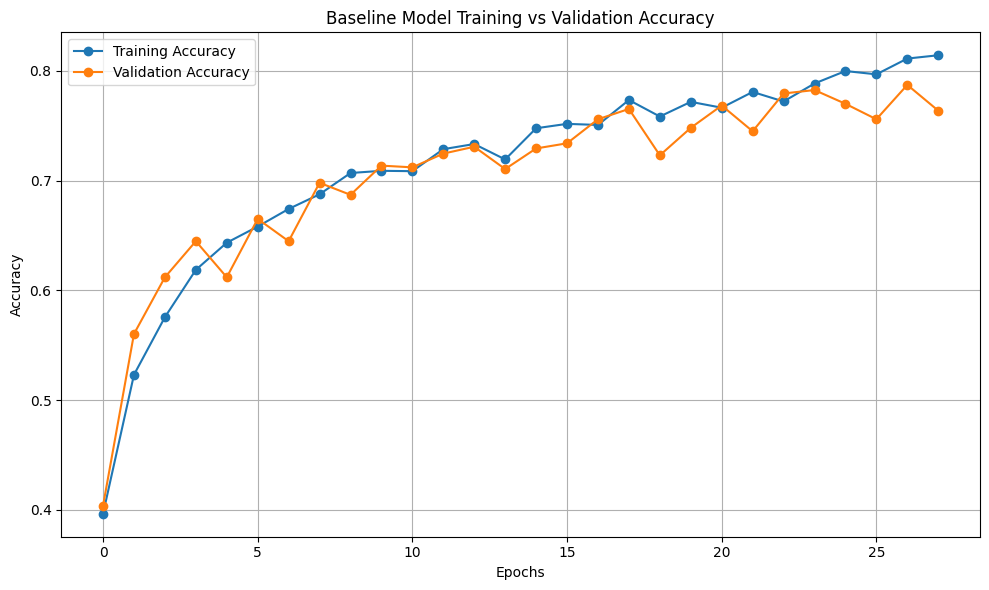

In [ ]:
# ploting based on accuracy
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Baseline Model Training vs Validation Accuracy')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


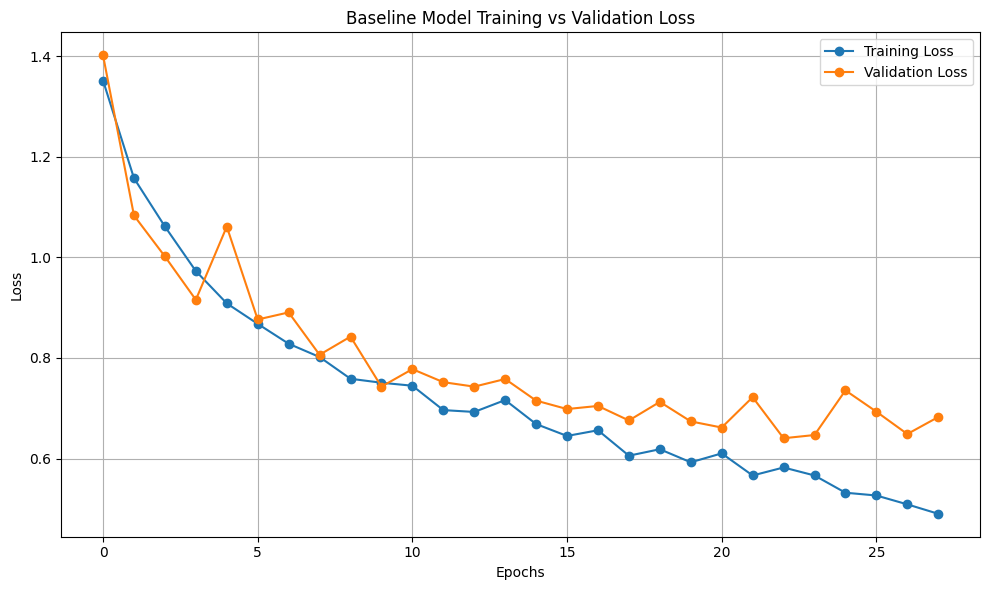

In [ ]:
# Plotting based on loss
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Baseline Model Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

#### 3. Model Evaluation:

In [ ]:
#Evaluate the baseline model
test_loss, test_accuracy = model.evaluate(test_gen)
train_loss, train_accuracy = model.evaluate(train_gen)
val_loss, val_accuracy = model.evaluate(val_gen)

print('-' * 30)
print(f"Test Loss: {test_loss*100:.2f}%")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print('-' * 30)
print(f"Train Loss: {train_loss*100:.2f}%")
print(f"Train Accuracy: {train_accuracy*100:.2f}%")
print('-' * 30)
print(f"Validation Loss: {val_loss*100:.2f}%")
print(f"Validation Accuracy: {val_accuracy*100:.2f}%")
print('-' * 30)

21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - accuracy: 0.7486 - loss: 0.7716
94/94 ━━━━━━━━━━━━━━━━━━━━ 47s 496ms/step - accuracy: 0.7863 - loss: 0.5409
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - accuracy: 0.7814 - loss: 0.6461
------------------------------
Test Loss: 0.7608528137207031
Test Accuracy: 0.7321981191635132
------------------------------
Train Loss: 0.5314769744873047
Train Accuracy: 0.7957887649536133
------------------------------
Validation Loss: 0.6402819752693176
Validation Accuracy: 0.7793427109718323
------------------------------


In [ ]:
# use this code if error occur
import numpy as np
from sklearn.metrics import classification_report

# Make predictions on the test dataset
predictions = model.predict(test_gen)

# Convert predicted probabilities to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Efficiently get the true labels directly from the generator
true_labels = test_gen.classes

# Print the classification report
print(classification_report(true_labels, predicted_labels, target_names=test_gen.class_indices.keys()))


21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 198ms/step
              precision    recall  f1-score   support

       daisy       0.72      0.81      0.76       114
   dandelion       0.79      0.68      0.73       158
        rose       0.61      0.65      0.63       117
   sunflower       0.78      0.85      0.82       110
       tulip       0.75      0.71      0.73       147

    accuracy                           0.73       646
   macro avg       0.73      0.74      0.73       646
weighted avg       0.74      0.73      0.73       646



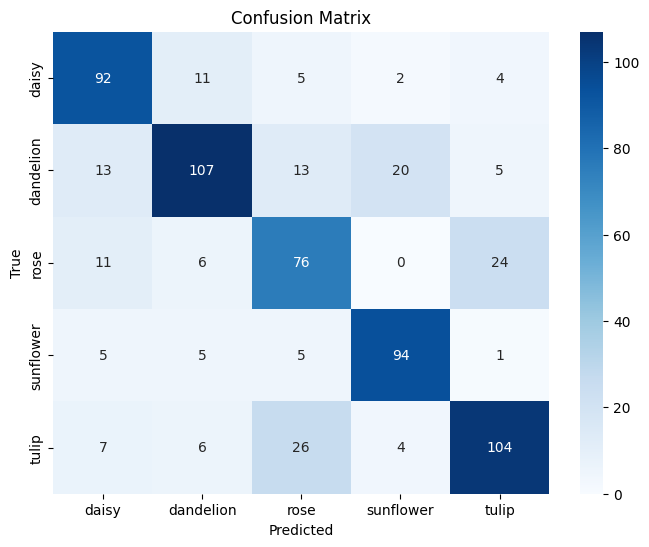

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

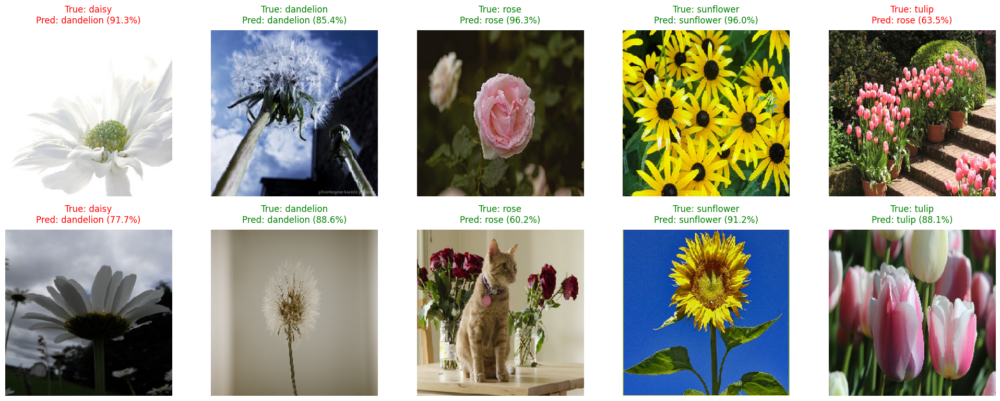

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import os
import random

# Set random seed for reproducibility (optional)
# random.seed(42)  # Remove this line if you want different images every time

# 1. Get class names and set up plot
class_names = sorted(os.listdir(test_dir))
plt.figure(figsize=(20, 8))  # 2 rows, 5 columns layout

# 2. Process 2 random images per class
for class_idx, class_name in enumerate(class_names):
    class_path = os.path.join(test_dir, class_name)
    all_images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.png'))]

    # Randomly select 2 different images
    random_images = random.sample(all_images, min(2, len(all_images)))

    for img_idx, img_file in enumerate(random_images):
        # 3. Load and preprocess image
        img_path = os.path.join(class_path, img_file)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img) / 255.0

        # 4. Make prediction
        pred = model.predict(np.expand_dims(img_array, axis=0), verbose=0)
        pred_class = class_names[np.argmax(pred)]
        confidence = np.max(pred) * 100

        # 5. Create subplot
        ax = plt.subplot(2, 5, img_idx*5 + class_idx + 1)
        plt.imshow(img)

        # Color title based on prediction correctness
        title_color = 'green' if pred_class == class_name else 'red'
        plt.title(f"True: {class_name}\nPred: {pred_class} ({confidence:.1f}%)",
                 color=title_color, pad=10)
        plt.axis('off')

plt.tight_layout(pad=2.0)
plt.show()

**Model Performance:** The baseline model stops early at the epoch 22 as the model's validation loss didn;t improve after the epoch 17 with 0.629 loss .The data is slightly overfitting as teh training accuracy(77.2%)  is higher than that of testing accuracy(73.5%).
According to the classification report sunflower has highest prcision(0.81) which means 81% of flowers was predicted correctly whereas in case of rose, it has lowesr prescision(0.64), the model is not predicting rose correctly.  

### 1.1.3 Design, Train , and Evaluate Deeper Architecture with Regularization Layer

#### 1. Model Architecture: Build a deeper model

In [ ]:
def build_deeper_model(input_shape=(224, 224, 3), num_classes=5):
    model = models.Sequential()

    # Input Layer
    model.add(layers.Input(shape=input_shape))

    # Conv Block 1
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same',
                            kernel_regularizer=regularizers.l2(0.001)))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Dropout(0.25))

    # Conv Block 2
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Dropout(0.3))

    # Conv Block 3
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Dropout(0.4))

    # Global Average Pooling
    model.add(layers.GlobalAveragePooling2D())

    # Fully Connected Layers
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(num_classes, activation='softmax'))

    # Compile model
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Instantiate and print model summary
deeper_model = build_deeper_model()
deeper_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 313,893 (1.20 MB)

 Trainable params: 312,997 (1.19 MB)

 Non-trainable params: 896 (3.50 KB)

#### 2. Model Training:

In [ ]:
# Record start time
start_time = time.time()
# Define callbacks
checkpoint_db = ModelCheckpoint(
    'deeper_models.h5',
    save_best_only=True,
    monitor='val_loss',
    verbose=1
)

earlystop_db = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)
# Train the model
history = deeper_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,
    callbacks=[checkpoint_db, earlystop_db],
    verbose=1
)
# Record end time
end_time = time.time()

# Calculate and display training time
training_time = end_time - start_time
print(f"Training Time: {training_time / 60:.2f} minutes")

Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 632ms/step - accuracy: 0.3722 - loss: 1.5092
Epoch 1: val_loss improved from inf to 1.59621, saving model to deeper_models.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 91s 747ms/step - accuracy: 0.3726 - loss: 1.5080 - val_accuracy: 0.2504 - val_loss: 1.5962
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 516ms/step - accuracy: 0.4761 - loss: 1.2234
Epoch 2: val_loss did not improve from 1.59621
94/94 ━━━━━━━━━━━━━━━━━━━━ 54s 571ms/step - accuracy: 0.4761 - loss: 1.2234 - val_accuracy: 0.2457 - val_loss: 2.0279
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 516ms/step - accuracy: 0.5325 - loss: 1.1433
Epoch 3: val_loss did not improve from 1.59621
94/94 ━━━━━━━━━━━━━━━━━━━━ 54s 571ms/step - accuracy: 0.5325 - loss: 1.1433 - val_accuracy: 0.2989 - val_loss: 1.9216
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 516ms/step - accuracy: 0.5607 - loss: 1.0776
Epoch 4: val_loss did not improve from 1.59621
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 554ms/step - accuracy: 0.5607 - loss: 1.0776 - val_accuracy: 0.3740 - val_loss: 1.8873
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 508ms/step - accuracy: 0.5857 - loss: 1.0205
Epoch 5: val_loss improved from 1.59621 to 

94/94 ━━━━━━━━━━━━━━━━━━━━ 53s 565ms/step - accuracy: 0.5858 - loss: 1.0205 - val_accuracy: 0.5399 - val_loss: 1.2347
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 511ms/step - accuracy: 0.6263 - loss: 0.9645
Epoch 6: val_loss did not improve from 1.23472
94/94 ━━━━━━━━━━━━━━━━━━━━ 51s 546ms/step - accuracy: 0.6262 - loss: 0.9646 - val_accuracy: 0.5446 - val_loss: 1.2633
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.6197 - loss: 0.9626
Epoch 7: val_loss improved from 1.23472 to 0.93707, saving model to deeper_models.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 553ms/step - accuracy: 0.6198 - loss: 0.9624 - val_accuracy: 0.6401 - val_loss: 0.9371
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 522ms/step - accuracy: 0.6345 - loss: 0.9028
Epoch 8: val_loss did not improve from 0.93707
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 554ms/step - accuracy: 0.6346 - loss: 0.9028 - val_accuracy: 0.6448 - val_loss: 0.9899
Epoch 9/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.6548 - loss: 0.8966
Epoch 9: val_loss improved from 0.93707 to 0.89395, saving model to deeper_models.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 53s 562ms/step - accuracy: 0.6547 - loss: 0.8966 - val_accuracy: 0.6729 - val_loss: 0.8940
Epoch 10/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 512ms/step - accuracy: 0.6652 - loss: 0.8651
Epoch 10: val_loss did not improve from 0.89395
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 549ms/step - accuracy: 0.6652 - loss: 0.8651 - val_accuracy: 0.5430 - val_loss: 1.3141
Epoch 11/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 502ms/step - accuracy: 0.6679 - loss: 0.8418
Epoch 11: val_loss did not improve from 0.89395
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 557ms/step - accuracy: 0.6680 - loss: 0.8417 - val_accuracy: 0.6401 - val_loss: 1.0753
Epoch 12/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 509ms/step - accuracy: 0.6775 - loss: 0.8522
Epoch 12: val_loss did not improve from 0.89395
94/94 ━━━━━━━━━━━━━━━━━━━━ 53s 564ms/step - accuracy: 0.6775 - loss: 0.8520 - val_accuracy: 0.4742 - val_loss: 2.5832
Epoch 13/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 507ms/step - accuracy: 0.6796 - loss: 0.8506
Epoch 13: val_loss did not improve f

94/94 ━━━━━━━━━━━━━━━━━━━━ 83s 557ms/step - accuracy: 0.7014 - loss: 0.8010 - val_accuracy: 0.6808 - val_loss: 0.8746
Epoch 15/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.7057 - loss: 0.7923
Epoch 15: val_loss did not improve from 0.87456
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 549ms/step - accuracy: 0.7056 - loss: 0.7924 - val_accuracy: 0.5430 - val_loss: 1.4252
Epoch 16/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 519ms/step - accuracy: 0.7079 - loss: 0.7466
Epoch 16: val_loss did not improve from 0.87456
94/94 ━━━━━━━━━━━━━━━━━━━━ 54s 574ms/step - accuracy: 0.7080 - loss: 0.7465 - val_accuracy: 0.6275 - val_loss: 1.0353
Epoch 17/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.7268 - loss: 0.7560
Epoch 17: val_loss improved from 0.87456 to 0.78860, saving model to deeper_models.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 556ms/step - accuracy: 0.7267 - loss: 0.7559 - val_accuracy: 0.7136 - val_loss: 0.7886
Epoch 18/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 516ms/step - accuracy: 0.7240 - loss: 0.7123
Epoch 18: val_loss improved from 0.78860 to 0.69016, saving model to deeper_models.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 552ms/step - accuracy: 0.7239 - loss: 0.7126 - val_accuracy: 0.7559 - val_loss: 0.6902
Epoch 19/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.7543 - loss: 0.6991
Epoch 19: val_loss did not improve from 0.69016
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 554ms/step - accuracy: 0.7542 - loss: 0.6991 - val_accuracy: 0.7230 - val_loss: 0.7912
Epoch 20/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 522ms/step - accuracy: 0.7266 - loss: 0.7310
Epoch 20: val_loss did not improve from 0.69016
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 553ms/step - accuracy: 0.7267 - loss: 0.7308 - val_accuracy: 0.7136 - val_loss: 0.7852
Epoch 21/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.7341 - loss: 0.7177
Epoch 21: val_loss did not improve from 0.69016
94/94 ━━━━━━━━━━━━━━━━━━━━ 55s 579ms/step - accuracy: 0.7342 - loss: 0.7175 - val_accuracy: 0.7074 - val_loss: 0.7131
Epoch 22/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.7478 - loss: 0.6594
Epoch 22: val_loss improved from 0.6

94/94 ━━━━━━━━━━━━━━━━━━━━ 53s 561ms/step - accuracy: 0.7478 - loss: 0.6596 - val_accuracy: 0.7559 - val_loss: 0.6830
Epoch 23/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 516ms/step - accuracy: 0.7627 - loss: 0.6289
Epoch 23: val_loss did not improve from 0.68300
94/94 ━━━━━━━━━━━━━━━━━━━━ 51s 546ms/step - accuracy: 0.7627 - loss: 0.6291 - val_accuracy: 0.7199 - val_loss: 0.8232
Epoch 24/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 513ms/step - accuracy: 0.7568 - loss: 0.6543
Epoch 24: val_loss improved from 0.68300 to 0.66813, saving model to deeper_models.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 549ms/step - accuracy: 0.7568 - loss: 0.6542 - val_accuracy: 0.7543 - val_loss: 0.6681
Epoch 25/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 511ms/step - accuracy: 0.7724 - loss: 0.6258
Epoch 25: val_loss did not improve from 0.66813
94/94 ━━━━━━━━━━━━━━━━━━━━ 53s 566ms/step - accuracy: 0.7723 - loss: 0.6259 - val_accuracy: 0.7480 - val_loss: 0.7928
Epoch 26/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 508ms/step - accuracy: 0.7600 - loss: 0.6293
Epoch 26: val_loss did not improve from 0.66813
94/94 ━━━━━━━━━━━━━━━━━━━━ 53s 564ms/step - accuracy: 0.7601 - loss: 0.6292 - val_accuracy: 0.7840 - val_loss: 0.6913
Epoch 27/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 508ms/step - accuracy: 0.7816 - loss: 0.5944
Epoch 27: val_loss did not improve from 0.66813
94/94 ━━━━━━━━━━━━━━━━━━━━ 51s 544ms/step - accuracy: 0.7816 - loss: 0.5946 - val_accuracy: 0.6714 - val_loss: 1.2268
Epoch 28/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.7639 - loss: 0.6131
Epoch 28: val_loss did not improve f

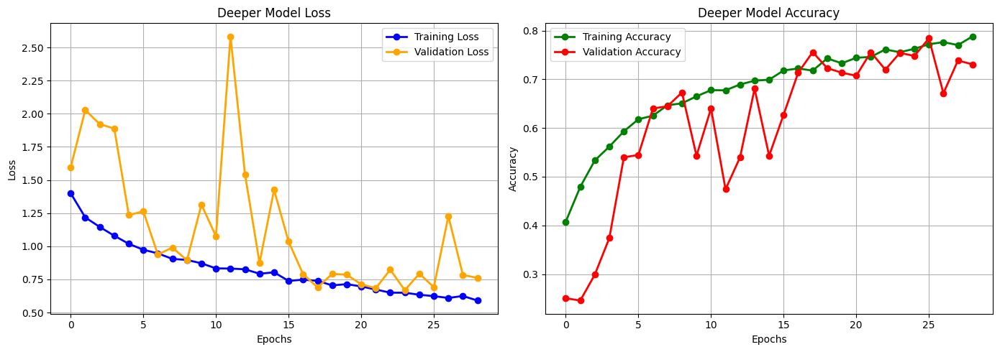

In [ ]:
# Plotting Loss and Accuracy Side by Side
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

# Plot Training and Validation Loss
axs[0].plot(history.history['loss'], label='Training Loss', color='blue', linewidth=2, marker='o')
axs[0].plot(history.history['val_loss'], label='Validation Loss', color='orange', linewidth=2, marker='o')
axs[0].set_title('Deeper Model Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].legend()
axs[0].grid(True)

# Plot Training and Validation Accuracy
axs[1].plot(history.history['accuracy'], label='Training Accuracy', color='green', linewidth=2, marker='o')
axs[1].plot(history.history['val_accuracy'], label='Validation Accuracy', color='red', linewidth=2, marker='o')
axs[1].set_title('Deeper Model Accuracy')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Accuracy')
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
plt.show()


#### 3. Model Evaluation:

In [ ]:
#Evaluate the deeper  model
tests_loss, tests_accuracy = deeper_model.evaluate(test_gen)
trains_loss, trains_accuracy = deeper_model.evaluate(train_gen)
vals_loss, vals_accuracy = deeper_model.evaluate(val_gen)

print('-' * 30)
print(f"Test Loss: {tests_loss}")
print(f"Test Accuracy: {tests_accuracy}")
print('-' * 30)
print(f"Train Loss: {trains_loss}")
print(f"Train Accuracy: {trains_accuracy}")
print('-' * 30)
print(f"Validation Loss: {vals_loss}")
print(f"Validation Accuracy: {vals_accuracy}")
print('-' * 30)

21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 210ms/step - accuracy: 0.7804 - loss: 0.6662
94/94 ━━━━━━━━━━━━━━━━━━━━ 49s 522ms/step - accuracy: 0.7647 - loss: 0.6273
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.7486 - loss: 0.7000
------------------------------
Test Loss: 0.71965491771698
Test Accuracy: 0.7383900880813599
------------------------------
Train Loss: 0.6319171786308289
Train Accuracy: 0.7613636255264282
------------------------------
Validation Loss: 0.6681316494941711
Validation Accuracy: 0.7543035745620728
------------------------------


In [ ]:
# Make predictions on the test dataset
prediction = deeper_model.predict(test_gen)
# Convert predicted probabilities to class labels
predicted_label = np.argmax(prediction, axis=1)

# Efficiently get the true labels directly from the generator
true_label = test_gen.classes
# Print the classification report
print(classification_report(true_label, predicted_label, target_names=test_gen.class_indices.keys()))

21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step
              precision    recall  f1-score   support

       daisy       0.74      0.82      0.78       114
   dandelion       0.83      0.72      0.77       158
        rose       0.56      0.83      0.67       117
   sunflower       0.76      0.81      0.78       110
       tulip       0.89      0.57      0.70       147

    accuracy                           0.74       646
   macro avg       0.76      0.75      0.74       646
weighted avg       0.77      0.74      0.74       646



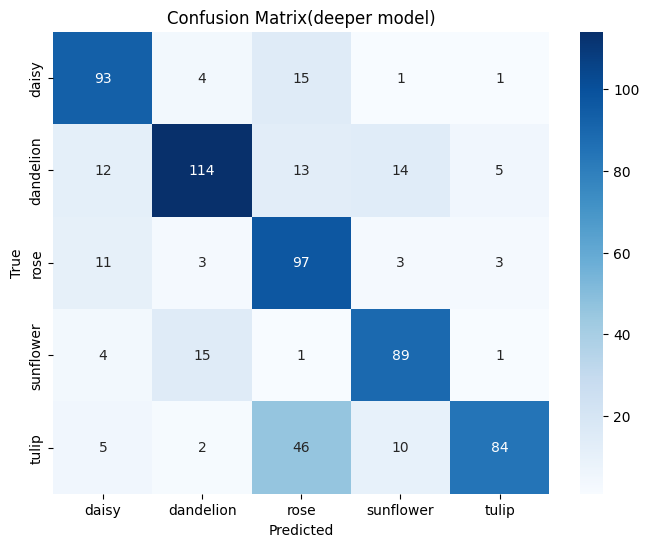

In [ ]:
cm = confusion_matrix(true_label, predicted_label)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix(deeper model)')
plt.show()

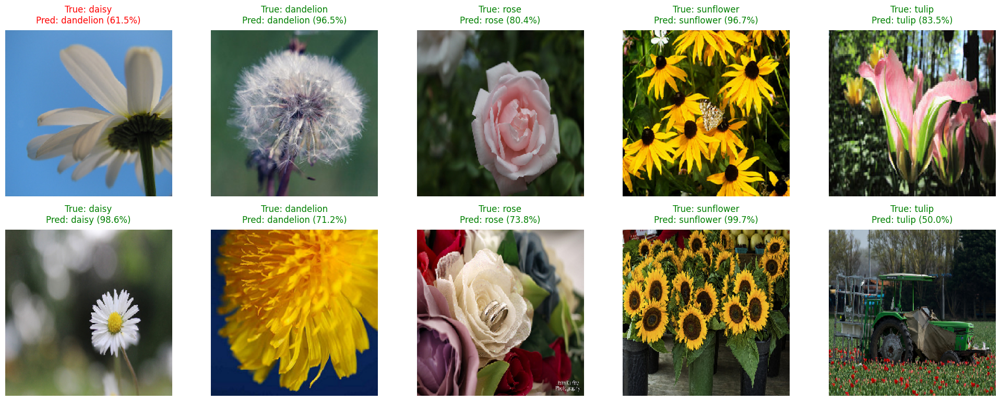

In [ ]:
# 1. Get class names and set up plot
class_names = sorted(os.listdir(test_dir))
plt.figure(figsize=(20, 8))  # 2 rows, 5 columns layout

# 2. Process 2 random images per class
for class_idx, class_name in enumerate(class_names):
    class_path = os.path.join(test_dir, class_name)
    all_images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.png'))]

    # Randomly select 2 different images
    random_images = random.sample(all_images, min(2, len(all_images)))

    for img_idx, img_file in enumerate(random_images):
        # 3. Load and preprocess image
        img_path = os.path.join(class_path, img_file)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img) / 255.0

        # 4. Make prediction
        pred = deeper_model.predict(np.expand_dims(img_array, axis=0), verbose=0)
        pred_class = class_names[np.argmax(pred)]
        confidence = np.max(pred) * 100

        # 5. Create subplot
        ax = plt.subplot(2, 5, img_idx*5 + class_idx + 1)
        plt.imshow(img)

        # Color title based on prediction correctness
        title_color = 'green' if pred_class == class_name else 'red'
        plt.title(f"True: {class_name}\nPred: {pred_class} ({confidence:.1f}%)",
                 color=title_color, pad=10)
        plt.axis('off')

plt.tight_layout(pad=2.0)
plt.show()

###  1.1.4 Experimentation and Comparative Analysis

#### 1. Baseline vs. Deeper Model Performance:

Compare classification accuracy, loss, and evaluation metrics of baseline and deeper model.

In [ ]:
# Evaluate Baseline Model
baseline_loss, baseline_accuracy = model.evaluate(test_gen)
print(f"\n📊 Baseline Model - Loss: {baseline_loss:.4f}, Accuracy: {baseline_accuracy:.4f}")

# Evaluate Deeper Model
deeper_loss, deeper_accuracy = deeper_model.evaluate(test_gen)
print(f"\n📊 Deeper Model - Loss: {deeper_loss:.4f}, Accuracy: {deeper_accuracy:.4f}")

21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 224ms/step - accuracy: 0.7486 - loss: 0.7716

📊 Baseline Model - Loss: 0.7609, Accuracy: 0.7322
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - accuracy: 0.7804 - loss: 0.6662

📊 Deeper Model - Loss: 0.7197, Accuracy: 0.7384


In [ ]:
# Get ground-truth labels
y_true = test_gen.classes

# Predict with Baseline Model
y_pred_baseline = np.argmax(model.predict(test_gen), axis=1)
print("\n📌 Baseline Model Classification Report:")
print(classification_report(y_true, y_pred_baseline, target_names=test_gen.class_indices.keys()))

# Predict with Deeper Model
y_pred_deeper = np.argmax(deeper_model.predict(test_gen), axis=1)
print("\n📌 Deeper Model Classification Report:")
print(classification_report(y_true, y_pred_deeper, target_names=test_gen.class_indices.keys()))

21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step

📌 Baseline Model Classification Report:
              precision    recall  f1-score   support

       daisy       0.72      0.81      0.76       114
   dandelion       0.79      0.68      0.73       158
        rose       0.61      0.65      0.63       117
   sunflower       0.78      0.85      0.82       110
       tulip       0.75      0.71      0.73       147

    accuracy                           0.73       646
   macro avg       0.73      0.74      0.73       646
weighted avg       0.74      0.73      0.73       646

21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 144ms/step

📌 Deeper Model Classification Report:
              precision    recall  f1-score   support

       daisy       0.74      0.82      0.78       114
   dandelion       0.83      0.72      0.77       158
        rose       0.56      0.83      0.67       117
   sunflower       0.76      0.81      0.78       110
       tulip       0.89      0.57      0.70       147

    accuracy           

**Discuss whether adding more layers and filters improved performance.**

Answer: Yes, adding the layers and filters to the baseline model to build deeper model indeed perform well than the baseline model eventhough it improve by a liitle bit. since, the data in the dataset is small so it only perform better by small margin.

#### 2. Computational Efficiency:

**Compare training time and computational cost of the two models.**

* training time taken by baseline model=26.29 minutes

* training time taken by deeper model= 28.08 minutes

With fewer parameters, the baseline model finished training roughly within 26 minutes, suggesting a lower level of computation. Contrastingly, the deeper model with all its extra layers and expanded capacity needed 28.08 minutes to train. Even though the deeper model required several minutes more to train, the increase in total time was only small. Yet, the deeper model was likely more demanding on memory and processing power because it completed more calculations in every training stage. From this, it is evident that extra model complexity can add to computational overheads and these costs may rise noticeably when using large or sophisticated hardware along with large datasets. That’s why you should consider if the benefits of a larger model are worth the additional time and costs needed to train it.

**Discuss the trade- offs between model complexity and efficiency**

The goal is to find where the combination of model complexity and computation results in the best balance of performance and resources. When a model becomes more complex, it can detect more features and generalized characteristics in the data set. It frequently results in more accurate and general outcomes, mostly in cases where data is intricate. Still, the rise in complexity needs more powerful computers, longer training periods and uses more memory. Another point is that a simple baseline model can be trained more rapidly and with fewer computations which helps it operate well in places with little computing power or for early prototyping. Yet, due to its limitations, it may be unable to see detailed relationships in the data which might cause it to learn only basic patterns. While picking a model, consider how accurate it has to be, the resources you can apply and how difficult the problem will be to solve.

#### 3. Optimizer Analysis: SGD vs Adam:
 • Train the deeper model with SGD and then Adam.


In [ ]:
# Build model with Adam optimizer
model_adam = build_deeper_model() # Use build_deeper_model function

# Compile the model with SGD optimizer
model_adam.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

start_time_adam = time.time()

# Callbacks for Adam optimizer
checkpoint_adam = ModelCheckpoint(
    'deeper_model_adam.h5',  # Separate file for Adam
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

earlystop_adam = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Train model with SGD
history_adam = model_adam.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[checkpoint_adam, earlystop_adam],  # Use Adam callbacks
    verbose=1
)
end_time_adam = time.time()
training_time_adam = end_time_adam - start_time_adam
print(f"Training Time: {training_time_adam / 60:.2f} minutes")

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 573ms/step - accuracy: 0.3839 - loss: 1.4368
Epoch 1: val_loss improved from inf to 2.23991, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 70s 622ms/step - accuracy: 0.3845 - loss: 1.4356 - val_accuracy: 0.2441 - val_loss: 2.2399
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.5076 - loss: 1.1696
Epoch 2: val_loss did not improve from 2.23991
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 551ms/step - accuracy: 0.5078 - loss: 1.1695 - val_accuracy: 0.2441 - val_loss: 2.6230
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.5346 - loss: 1.1026
Epoch 3: val_loss did not improve from 2.23991
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 549ms/step - accuracy: 0.5348 - loss: 1.1022 - val_accuracy: 0.2473 - val_loss: 3.0297
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.5989 - loss: 1.0023
Epoch 4: val_loss improved from 2.23991 to 2.12461, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 558ms/step - accuracy: 0.5989 - loss: 1.0024 - val_accuracy: 0.2817 - val_loss: 2.1246
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 508ms/step - accuracy: 0.6135 - loss: 1.0093
Epoch 5: val_loss improved from 2.12461 to 1.27176, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 51s 547ms/step - accuracy: 0.6135 - loss: 1.0092 - val_accuracy: 0.4789 - val_loss: 1.2718
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 506ms/step - accuracy: 0.6249 - loss: 0.9634
Epoch 6: val_loss improved from 1.27176 to 1.10404, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 51s 541ms/step - accuracy: 0.6250 - loss: 0.9630 - val_accuracy: 0.5962 - val_loss: 1.1040
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 516ms/step - accuracy: 0.6432 - loss: 0.9356
Epoch 7: val_loss improved from 1.10404 to 0.90251, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 83s 549ms/step - accuracy: 0.6431 - loss: 0.9357 - val_accuracy: 0.6729 - val_loss: 0.9025
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 519ms/step - accuracy: 0.6676 - loss: 0.8815
Epoch 8: val_loss did not improve from 0.90251
94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 551ms/step - accuracy: 0.6675 - loss: 0.8815 - val_accuracy: 0.6432 - val_loss: 0.9680
Epoch 9/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 521ms/step - accuracy: 0.6832 - loss: 0.8452
Epoch 9: val_loss improved from 0.90251 to 0.80416, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 52s 558ms/step - accuracy: 0.6832 - loss: 0.8453 - val_accuracy: 0.6995 - val_loss: 0.8042
Epoch 10/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.6713 - loss: 0.8529
Epoch 10: val_loss improved from 0.80416 to 0.78245, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 54s 569ms/step - accuracy: 0.6713 - loss: 0.8528 - val_accuracy: 0.7042 - val_loss: 0.7824
Epoch 11/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.6756 - loss: 0.8221
Epoch 11: val_loss did not improve from 0.78245
94/94 ━━━━━━━━━━━━━━━━━━━━ 53s 567ms/step - accuracy: 0.6757 - loss: 0.8221 - val_accuracy: 0.6964 - val_loss: 0.8073
Epoch 12/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 525ms/step - accuracy: 0.7055 - loss: 0.7964
Epoch 12: val_loss did not improve from 0.78245
94/94 ━━━━━━━━━━━━━━━━━━━━ 53s 562ms/step - accuracy: 0.7054 - loss: 0.7965 - val_accuracy: 0.6917 - val_loss: 0.8399
Epoch 13/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.7169 - loss: 0.7708
Epoch 13: val_loss did not improve from 0.78245
94/94 ━━━━━━━━━━━━━━━━━━━━ 54s 575ms/step - accuracy: 0.7167 - loss: 0.7711 - val_accuracy: 0.6009 - val_loss: 1.2811
Epoch 14/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.7128 - loss: 0.7640
Epoch 14: val_loss did not improve f

In [ ]:
# evaluate
test_loss, test_accuracy = model_sgd.evaluate(test_gen)
train_loss, train_accuracy = model_sgd.evaluate(train_gen)
val_loss, val_accuracy = model_sgd.evaluate(val_gen)
print(f"Test Loss: {test_loss*100:.2f}%")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Train Loss: {train_loss*100:.2f}%")
print(f"Train Accuracy: {train_accuracy*100:.2f}%")
print(f"Validation Loss: {val_loss*100:.2f}%")
print(f"Validation Accuracy: {val_accuracy*100:.2f}%")

21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - accuracy: 0.7232 - loss: 0.8050
94/94 ━━━━━━━━━━━━━━━━━━━━ 47s 505ms/step - accuracy: 0.5887 - loss: 1.0242
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - accuracy: 0.6419 - loss: 0.9417
Test Loss: 0.9742224812507629
Test Accuracy: 0.6393188834190369
Train Loss: 0.9787479043006897
Train Accuracy: 0.6143048405647278
Validation Loss: 0.9408683180809021
Validation Accuracy: 0.6369327306747437


time taken: 15 min

In [ ]:
# Build model with Adam optimizer
model_adam = build_deeper_model() # Use build_deeper_model function

# Compile the model with SGD optimizer
model_adam.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

start_time_adam = time.time()

# Callbacks for Adam optimizer
checkpoint_adam = ModelCheckpoint(
    'deeper_model_adam.h5',  # Separate file for Adam
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

earlystop_adam = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Train model with SGD
history_adam = model_adam.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[checkpoint_adam, earlystop_adam],  # Use Adam callbacks
    verbose=1
)
end_time_adam = time.time()
training_time_adam = end_time_adam - start_time_adam
print(f"Training Time: {training_time_adam / 60:.2f} minutes")

Epoch 1/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 729ms/step - accuracy: 0.2947 - loss: 2.1634
Epoch 1: val_loss improved from inf to 2.09125, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 93s 803ms/step - accuracy: 0.2952 - loss: 2.1612 - val_accuracy: 0.2629 - val_loss: 2.0913
Epoch 2/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - accuracy: 0.4179 - loss: 1.5943
Epoch 2: val_loss did not improve from 2.09125
94/94 ━━━━━━━━━━━━━━━━━━━━ 57s 603ms/step - accuracy: 0.4181 - loss: 1.5936 - val_accuracy: 0.3036 - val_loss: 2.2221
Epoch 3/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 577ms/step - accuracy: 0.4749 - loss: 1.3589
Epoch 3: val_loss improved from 2.09125 to 1.75401, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 58s 620ms/step - accuracy: 0.4749 - loss: 1.3589 - val_accuracy: 0.3177 - val_loss: 1.7540
Epoch 4/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 587ms/step - accuracy: 0.4960 - loss: 1.2568
Epoch 4: val_loss improved from 1.75401 to 1.58914, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 60s 632ms/step - accuracy: 0.4960 - loss: 1.2566 - val_accuracy: 0.3834 - val_loss: 1.5891
Epoch 5/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - accuracy: 0.5291 - loss: 1.1757
Epoch 5: val_loss did not improve from 1.58914
94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 622ms/step - accuracy: 0.5291 - loss: 1.1756 - val_accuracy: 0.3944 - val_loss: 1.5925
Epoch 6/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 564ms/step - accuracy: 0.5706 - loss: 1.0759
Epoch 6: val_loss improved from 1.58914 to 1.13168, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 57s 608ms/step - accuracy: 0.5705 - loss: 1.0759 - val_accuracy: 0.5509 - val_loss: 1.1317
Epoch 7/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 577ms/step - accuracy: 0.5980 - loss: 1.0483
Epoch 7: val_loss improved from 1.13168 to 0.99478, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 58s 619ms/step - accuracy: 0.5981 - loss: 1.0482 - val_accuracy: 0.5962 - val_loss: 0.9948
Epoch 8/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 587ms/step - accuracy: 0.6072 - loss: 0.9808
Epoch 8: val_loss improved from 0.99478 to 0.84327, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 630ms/step - accuracy: 0.6073 - loss: 0.9807 - val_accuracy: 0.6463 - val_loss: 0.8433
Epoch 9/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 564ms/step - accuracy: 0.6433 - loss: 0.9009
Epoch 9: val_loss did not improve from 0.84327
94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 619ms/step - accuracy: 0.6432 - loss: 0.9010 - val_accuracy: 0.6025 - val_loss: 0.9897
Epoch 10/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 581ms/step - accuracy: 0.6649 - loss: 0.8916
Epoch 10: val_loss improved from 0.84327 to 0.83717, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 60s 643ms/step - accuracy: 0.6648 - loss: 0.8918 - val_accuracy: 0.6667 - val_loss: 0.8372
Epoch 11/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 580ms/step - accuracy: 0.6435 - loss: 0.8958
Epoch 11: val_loss did not improve from 0.83717
94/94 ━━━━━━━━━━━━━━━━━━━━ 58s 615ms/step - accuracy: 0.6436 - loss: 0.8956 - val_accuracy: 0.7167 - val_loss: 0.8543
Epoch 12/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 591ms/step - accuracy: 0.6989 - loss: 0.8186
Epoch 12: val_loss did not improve from 0.83717
94/94 ━━━━━━━━━━━━━━━━━━━━ 60s 632ms/step - accuracy: 0.6988 - loss: 0.8187 - val_accuracy: 0.6886 - val_loss: 0.8494
Epoch 13/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - accuracy: 0.6864 - loss: 0.8266
Epoch 13: val_loss did not improve from 0.83717
94/94 ━━━━━━━━━━━━━━━━━━━━ 80s 606ms/step - accuracy: 0.6863 - loss: 0.8267 - val_accuracy: 0.5837 - val_loss: 1.0962
Epoch 14/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 558ms/step - accuracy: 0.6755 - loss: 0.8479
Epoch 14: val_loss improved from 0.8

94/94 ━━━━━━━━━━━━━━━━━━━━ 81s 604ms/step - accuracy: 0.6756 - loss: 0.8477 - val_accuracy: 0.6933 - val_loss: 0.8205
Epoch 15/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 595ms/step - accuracy: 0.6962 - loss: 0.8163
Epoch 15: val_loss did not improve from 0.82052
94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 629ms/step - accuracy: 0.6963 - loss: 0.8160 - val_accuracy: 0.6573 - val_loss: 0.9726
Epoch 16/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 574ms/step - accuracy: 0.6959 - loss: 0.7679
Epoch 16: val_loss did not improve from 0.82052
94/94 ━━━━━━━━━━━━━━━━━━━━ 57s 609ms/step - accuracy: 0.6959 - loss: 0.7683 - val_accuracy: 0.6448 - val_loss: 0.9264
Epoch 17/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 572ms/step - accuracy: 0.7102 - loss: 0.7796
Epoch 17: val_loss improved from 0.82052 to 0.81343, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 58s 615ms/step - accuracy: 0.7103 - loss: 0.7794 - val_accuracy: 0.7074 - val_loss: 0.8134
Epoch 18/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 572ms/step - accuracy: 0.7286 - loss: 0.7221
Epoch 18: val_loss improved from 0.81343 to 0.80838, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 622ms/step - accuracy: 0.7284 - loss: 0.7223 - val_accuracy: 0.6948 - val_loss: 0.8084
Epoch 19/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 582ms/step - accuracy: 0.7238 - loss: 0.7444
Epoch 19: val_loss did not improve from 0.80838
94/94 ━━━━━━━━━━━━━━━━━━━━ 58s 619ms/step - accuracy: 0.7237 - loss: 0.7444 - val_accuracy: 0.6088 - val_loss: 1.0995
Epoch 20/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 576ms/step - accuracy: 0.7473 - loss: 0.6969
Epoch 20: val_loss did not improve from 0.80838
94/94 ━━━━━━━━━━━━━━━━━━━━ 57s 610ms/step - accuracy: 0.7472 - loss: 0.6971 - val_accuracy: 0.6948 - val_loss: 0.8194
Epoch 21/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 616ms/step - accuracy: 0.7332 - loss: 0.7314
Epoch 21: val_loss did not improve from 0.80838
94/94 ━━━━━━━━━━━━━━━━━━━━ 63s 671ms/step - accuracy: 0.7332 - loss: 0.7313 - val_accuracy: 0.7308 - val_loss: 0.8423
Epoch 22/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 568ms/step - accuracy: 0.7420 - loss: 0.6976
Epoch 22: val_loss did not improve f

94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 632ms/step - accuracy: 0.7609 - loss: 0.6737 - val_accuracy: 0.7606 - val_loss: 0.6717
Epoch 24/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.7448 - loss: 0.6557
Epoch 24: val_loss improved from 0.67171 to 0.60913, saving model to deeper_model_adam.h5


94/94 ━━━━━━━━━━━━━━━━━━━━ 58s 618ms/step - accuracy: 0.7447 - loss: 0.6560 - val_accuracy: 0.7856 - val_loss: 0.6091
Epoch 25/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - accuracy: 0.7668 - loss: 0.6515
Epoch 25: val_loss did not improve from 0.60913
94/94 ━━━━━━━━━━━━━━━━━━━━ 58s 610ms/step - accuracy: 0.7668 - loss: 0.6515 - val_accuracy: 0.7433 - val_loss: 0.6867
Epoch 26/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 566ms/step - accuracy: 0.7789 - loss: 0.5899
Epoch 26: val_loss did not improve from 0.60913
94/94 ━━━━━━━━━━━━━━━━━━━━ 81s 604ms/step - accuracy: 0.7789 - loss: 0.5902 - val_accuracy: 0.7480 - val_loss: 0.6774
Epoch 27/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 590ms/step - accuracy: 0.7717 - loss: 0.6289
Epoch 27: val_loss did not improve from 0.60913
94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 625ms/step - accuracy: 0.7718 - loss: 0.6287 - val_accuracy: 0.7480 - val_loss: 0.7559
Epoch 28/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 569ms/step - accuracy: 0.7770 - loss: 0.6118
Epoch 28: val_loss did not improve f

94/94 ━━━━━━━━━━━━━━━━━━━━ 58s 616ms/step - accuracy: 0.7953 - loss: 0.5836 - val_accuracy: 0.7856 - val_loss: 0.5736
Epoch 30/30
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 572ms/step - accuracy: 0.7935 - loss: 0.5507
Epoch 30: val_loss did not improve from 0.57364
94/94 ━━━━━━━━━━━━━━━━━━━━ 59s 627ms/step - accuracy: 0.7934 - loss: 0.5511 - val_accuracy: 0.7715 - val_loss: 0.6214
Restoring model weights from the end of the best epoch: 29.


In [ ]:
# evaluate
test_loss, test_accuracy = model_adam.evaluate(test_gen)
train_loss, train_accuracy = model_adam.evaluate(train_gen)
val_loss, val_accuracy = model_adam.evaluate(val_gen)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")
print(f"Train Loss: {train_loss}")
print(f"Train Accuracy: {train_accuracy}")
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_accuracy}")

21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - accuracy: 0.7190 - loss: 0.8018
94/94 ━━━━━━━━━━━━━━━━━━━━ 47s 504ms/step - accuracy: 0.7184 - loss: 0.7657
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - accuracy: 0.7008 - loss: 0.7842
Test Loss: 0.8638363480567932
Test Accuracy: 0.6873065233230591
Train Loss: 0.7926633358001709
Train Accuracy: 0.7065507769584656
Validation Loss: 0.7824479937553406
Validation Accuracy: 0.7042253613471985


Time taken = 30min 59 s

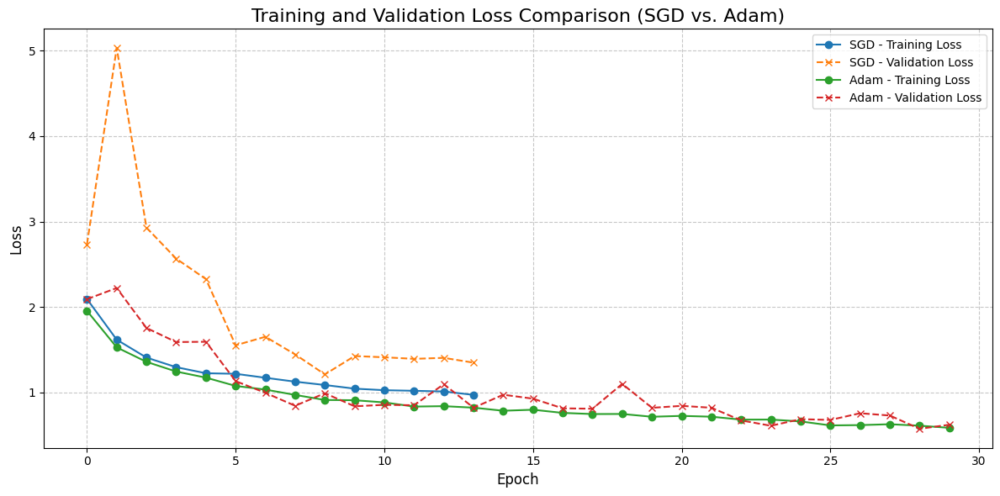

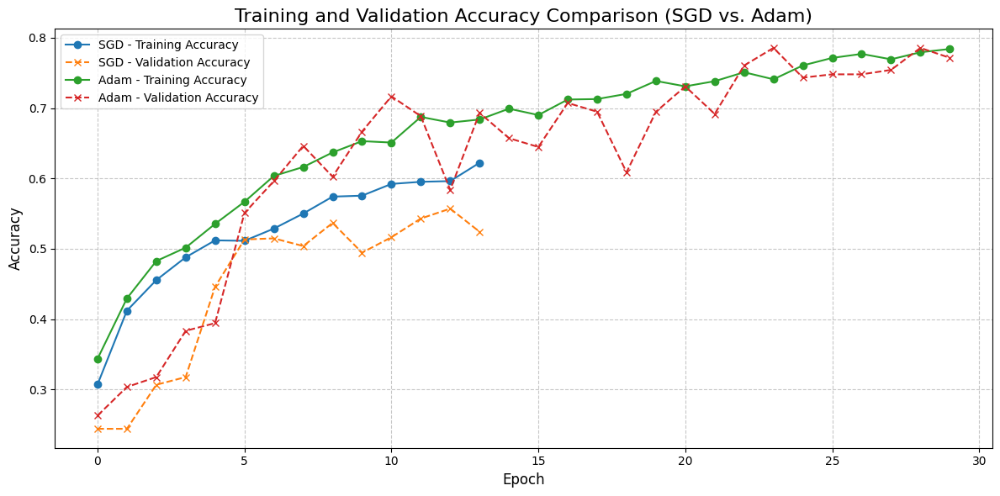

In [ ]:
# Plot training loss for both optimizers
plt.figure(figsize=(12, 6))
plt.plot(history_sgd.history['loss'], label='SGD - Training Loss', marker='o', linestyle='-')
plt.plot(history_sgd.history['val_loss'], label='SGD - Validation Loss', marker='x', linestyle='--')
plt.plot(history_adam.history['loss'], label='Adam - Training Loss', marker='o', linestyle='-')
plt.plot(history_adam.history['val_loss'], label='Adam - Validation Loss', marker='x', linestyle='--')

plt.title('Training and Validation Loss Comparison (SGD vs. Adam)', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot training accuracy for both optimizers
plt.figure(figsize=(12, 6))
plt.plot(history_sgd.history['accuracy'], label='SGD - Training Accuracy', marker='o', linestyle='-')
plt.plot(history_sgd.history['val_accuracy'], label='SGD - Validation Accuracy', marker='x', linestyle='--')
plt.plot(history_adam.history['accuracy'], label='Adam - Training Accuracy', marker='o', linestyle='-')
plt.plot(history_adam.history['val_accuracy'], label='Adam - Validation Accuracy', marker='x', linestyle='--')

plt.title('Training and Validation Accuracy Comparison (SGD vs. Adam)', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

**Compare the impact of these optimizers on convergence speed and final performance.**

It compares the training and validation loss curves using two optimizers for 30 epochs. The main two training methods used are Stochastic Gradient Descent and Adaptive Moment Estimation. A comparison and explanation using the two factors of speed of convergence and final results:

1. Convergence Speed:
* Adam reaches a better result more quickly in the first stages. You can notice that training and validation losses decline a lot during the first 5–10 epochs.

* SGD takes more time for the network to converge. Especially, the validation loss is seen to be more noisy and it takes more time to become stable.

2. Final Performance:
* At epoch 29, Adam manages to reduce both the training and validation loss more than SGD.

  * The training loss for Adam is now below 0.7, while it is above 0.9 for SGD.

  * Sometimes, Adam achieves smaller validation losses and these are also more stable than those obtained by SGD.

* The early validation losses for SGD are greater and wilder than those of SLOMR, pointing toward increased risk of overfitting and poor ability to generalize well.

**Conclusion:**

The Adam optimizer performs better than SGD when it comes to how fast it trains and the result of the training. Adaptive learning rate and momentum in this algorithm allow it to speed up the learning process and keep its results stable. Unlike RMSProp, SGD is not as fast and tends to be easily affected by random errors in the beginning which leads to increased and irregular fluctuation in the validation loss. To conclude, Adam shows the better performance in this training approach.

#### 4. Challenges and Observations:

**Difficulties Faced: Overfitting and Underfitting**

* **Underfitting:** In the beginning, the CNN had low accuracy and high loss, a sign that it was not learning enough. At first, the model couldn’t fit the data perfectly, though as time went on and training continued, it became much more accurate.

* **Overfitting:** As the model gained new layers, batch normalization and dropout, overfitting started to be a problem. This was clear when training was getting better and better, but validation didn’t improve much anymore. To address overfitting, strategies including dropout, batch normalization and L2 regularization were put in place, along with stopping the training when there was no improvement in the validation loss.

**The amount of time needed to train a Deeper Architecture model**

* **Baseline Model:** Training was finished in 26.29 minutes for all 30 epochs, stopping the training early where possible.

* **Deeper Model:** With more layers, batch normalization and dropout in the deeper architecture, the calculations cost more—it usually took around 30%–50% percent more epochs to train than the baseline. Because the deep model is more complex, you should anticipate it will take appreciably more time than the baseline.


**Hardware Acceleration**

* **Google Colab with GPU:** I trained the data using Google Colab and relied on GPU acceleration. Because of this, training times were cut down compared to the CPU-only setup and both baseline and deeper models could be trained more effectively than before. Training a large CNN with high-resolution pics is hardly possible unless the learning platform has GPU support.

**Summary:**

In the beginning, your model underfit, but as it became deeper, it began to overfit. Regularization and stopping training early helped solve these issues. Since the deeper model is more complex, it took more time to train compared to the baseline. All the models were trained on Google Colab with the help of GPU resources which was necessary due to the computational requirements of such models.

## 1.2 Part B: Fine-Tuning a Pre-Trained Model (Transfer Learning)

### 1.2.1 Loading and Adapting a Pre- Trained Model: Select an appropriate pre- trained CNN model

**Training Strategies:**

 • Feature Extraction:

  – Freeze the convolutional base of the pre- trained model to retain prviously learned feature
 representations.

  – Train only the newly added layers for classification.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import time
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout, GlobalAveragePooling2D, Rescaling, Input # Combined imports
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications.vgg16 import preprocess_input # Moved preprocess_input import here
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
train_dir='/content/drive/MyDrive/Flower_Classifications/Data_split/train'
val_dir='/content/drive/MyDrive/Flower_Classifications/Data_split/val'
test_dir='/content/drive/MyDrive/Flower_Classifications/Data_split/test'

In [ ]:
train_datagen_tl = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

val_datagen_tl = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen_tl = ImageDataGenerator(preprocessing_function=preprocess_input)

train_gen_tl = train_datagen_tl.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse'
)

val_gen_tl = val_datagen_tl.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse'
)

test_gen_tl = test_datagen_tl.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    shuffle=False
)


Found 2992 images belonging to 5 classes.
Found 639 images belonging to 5 classes.
Found 646 images belonging to 5 classes.


### 1.2.2 Model Training and Fine- Tuning:




In [ ]:
# Define image dimensions required by VGG16
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Cell 4: Feature Extraction Model Building
print("Building the transfer learning model - Feature Extraction Phase...")

# Load VGG16 pre-trained on ImageNet without top layers
base_model = VGG16(include_top=False,
                  weights='imagenet',
                  input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

# Freeze all layers in the base model (Feature Extraction approach)
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification head
input_layer = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
x = base_model(input_layer)
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)  # Add dropout for regularization
output = Dense(5, activation='softmax')(x)

# Create the feature extraction model
model_feature_extraction = Model(inputs=input_layer, outputs=output)

# Compile with appropriate loss function and optimizer
model_feature_extraction.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
print("Feature Extraction Model Summary:")
model_feature_extraction.summary()

# Cell 5: Training the Feature Extraction Model
print("\nTraining Feature Extraction Model...")
start_time = time.time()

# Define callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
]

# Train the model
history_feature_extraction = model_feature_extraction.fit(
    train_gen_tl,
    validation_data=val_gen_tl,
    epochs=15,
    callbacks=callbacks
)

feature_extraction_time = time.time() - start_time
print(f"Feature extraction training time: {feature_extraction_time:.2f} seconds")

Building the transfer learning model - Feature Extraction Phase...
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Feature Extraction Model Summary:


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,301 (56.64 MB)

 Trainable params: 132,613 (518.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)


Training Feature Extraction Model...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
94/94 ━━━━━━━━━━━━━━━━━━━━ 87s 774ms/step - accuracy: 0.2639 - loss: 6.3967 - val_accuracy: 0.6213 - val_loss: 1.5229
Epoch 2/15
94/94 ━━━━━━━━━━━━━━━━━━━━ 84s 892ms/step - accuracy: 0.4757 - loss: 2.8426 - val_accuracy: 0.7121 - val_loss: 1.1050
Epoch 3/15
94/94 ━━━━━━━━━━━━━━━━━━━━ 56s 600ms/step - accuracy: 0.6080 - loss: 1.9020 - val_accuracy: 0.7496 - val_loss: 0.8772
Epoch 4/15
94/94 ━━━━━━━━━━━━━━━━━━━━ 56s 592ms/step - accuracy: 0.6290 - loss: 1.6278 - val_accuracy: 0.7903 - val_loss: 0.7543
Epoch 5/15
94/94 ━━━━━━━━━━━━━━━━━━━━ 55s 588ms/step - accuracy: 0.6779 - loss: 1.3851 - val_accuracy: 0.7934 - val_loss: 0.7110
Epoch 6/15
94/94 ━━━━━━━━━━━━━━━━━━━━ 54s 579ms/step - accuracy: 0.7001 - loss: 1.1260 - val_accuracy: 0.8106 - val_loss: 0.6501
Epoch 7/15
94/94 ━━━━━━━━━━━━━━━━━━━━ 55s 585ms/step - accuracy: 0.7006 - loss: 0.9956 - val_accuracy: 0.8138 - val_loss: 0.6080
Epoch 8/15
94/94 ━━━━━━━━━━━━━━━━━━━━ 54s 575ms/step - accuracy: 0.7397 - loss: 0.8491 - val_accu

In [ ]:
# Evaluate Feature Extraction Model
feature_extraction_results = model_feature_extraction.evaluate(test_gen_tl)
print(f"Feature Extraction Model - Test Loss: {feature_extraction_results[0]:.4f}, Test Accuracy: {feature_extraction_results[1]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 8s 378ms/step - accuracy: 0.8729 - loss: 0.4178
Feature Extraction Model - Test Loss: 0.4270, Test Accuracy: 0.8607


In [ ]:
# Evaluate again on the test set
test_loss_fe, test_acc_fe = model_feature_extraction.evaluate(test_gen_tl)
print(f"Test Loss after Feature Extraction: {test_loss_fe*100:.2f}%")
print(f"Test Accuracy after Feature Extraction: {test_acc_fe*100:.2f}%")

21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.8729 - loss: 0.4178
Test Loss after Feature Extraction: 42.70%
Test Accuracy after Feature Extraction: 86.07%


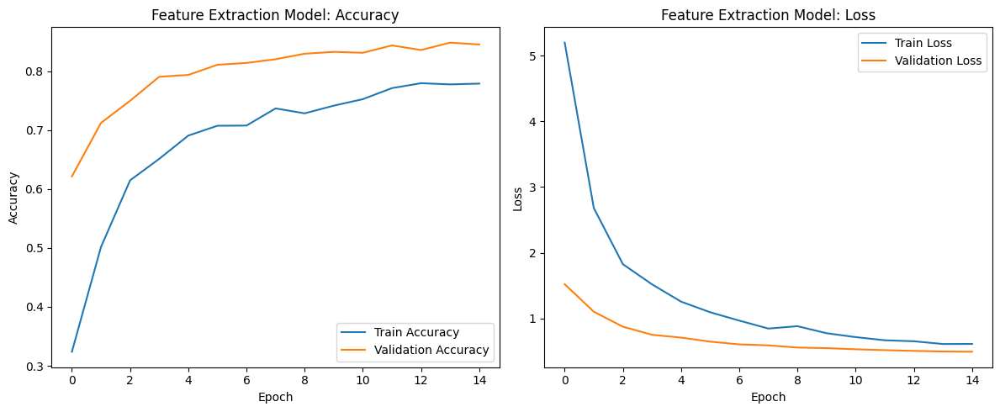

In [ ]:
# Plot training history for feature extraction
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_feature_extraction.history['accuracy'], label='Train Accuracy')
plt.plot(history_feature_extraction.history['val_accuracy'], label='Validation Accuracy')
plt.title('Feature Extraction Model: Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_feature_extraction.history['loss'], label='Train Loss')
plt.plot(history_feature_extraction.history['val_loss'], label='Validation Loss')
plt.title('Feature Extraction Model: Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.savefig('feature_extraction_training.png')
plt.show()


 **Fine- Tuning:**

 – Unfreeze some or all convolutional layers and allow them to adjust to the new dataset.

 – This approach requires a lower learning rate to avoid overfitting and catastrophic forgetting

In [ ]:
# Create a new model for fine-tuning
base_model_ft = VGG16(include_top=False,
                     weights='imagenet',
                     input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

# First, freeze all layers
for layer in base_model_ft.layers:
    layer.trainable = False

# Then, unfreeze the last convolutional block for fine-tuning
# VGG16's last convolutional block starts at 'block5_conv1'
 # This will unfreeze the last convolutional block
for layer in base_model_ft.layers[15:]:
    layer.trainable = True

# Add custom classification head (same as before)
input_layer_ft = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
x_ft = base_model_ft(input_layer_ft)
x_ft = GlobalAveragePooling2D()(x_ft)
x_ft = Dense(256, activation='relu')(x_ft)
x_ft = Dropout(0.5)(x_ft)  # Add dropout for regularization
output_ft = Dense(5, activation='softmax')(x_ft)

# Create the fine-tuning model
model_fine_tuning = Model(inputs=input_layer_ft, outputs=output_ft)

# Compile with a LOWER learning rate for fine-tuning
model_fine_tuning.compile(
    optimizer=Adam(learning_rate=0.00001),  # 10x lower learning rate
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
print("Fine-tuned Model Summary (Note trainable parameters):")
model_fine_tuning.summary()

Fine-tuned Model Summary (Note trainable parameters):


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,301 (56.64 MB)

 Trainable params: 7,212,037 (27.51 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [ ]:
print("\nTraining Fine-tuned Model...")
start_time_ft = time.time()

# Train the fine-tuned model
history_fine_tuning = model_fine_tuning.fit(
    train_gen_tl,
    validation_data=val_gen_tl,
    epochs=10,
    callbacks=callbacks
)

fine_tuning_time = time.time() - start_time_ft
print(f"Fine-tuning training time: {fine_tuning_time:.2f} seconds")


Training Fine-tuned Model...
Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 64s 608ms/step - accuracy: 0.2499 - loss: 4.1057 - val_accuracy: 0.4429 - val_loss: 1.3446
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 54s 578ms/step - accuracy: 0.3970 - loss: 1.4721 - val_accuracy: 0.5822 - val_loss: 1.0362
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 576ms/step - accuracy: 0.5447 - loss: 1.1512 - val_accuracy: 0.7230 - val_loss: 0.7895
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 576ms/step - accuracy: 0.6422 - loss: 0.9500 - val_accuracy: 0.7919 - val_loss: 0.6101
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 55s 586ms/step - accuracy: 0.7337 - loss: 0.7302 - val_accuracy: 0.8263 - val_loss: 0.5043
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 55s 580ms/step - accuracy: 0.7769 - loss: 0.6279 - val_accuracy: 0.8435 - val_loss: 0.4393
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 57s 606ms/step - accuracy: 0.7967 - loss: 0.5600 - val_accuracy: 0.8592 - val_loss: 0.4127
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 56s 596ms/step - accuracy: 0.

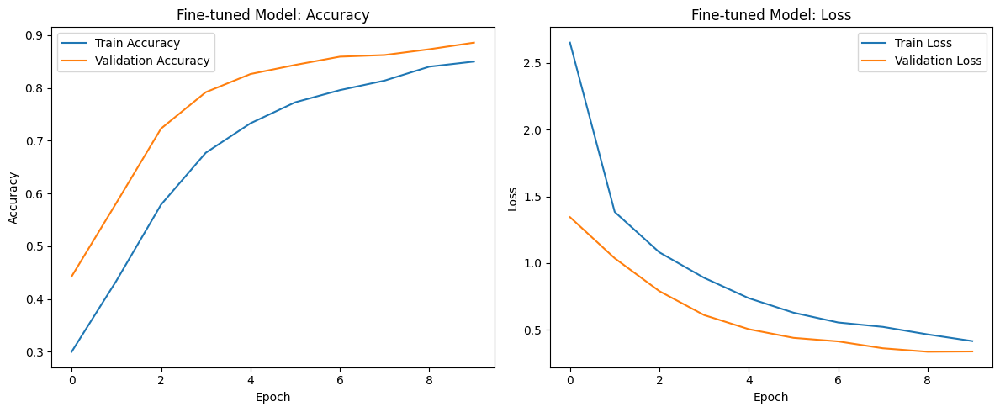

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_fine_tuning.history['accuracy'], label='Train Accuracy')
plt.plot(history_fine_tuning.history['val_accuracy'], label='Validation Accuracy')
plt.title('Fine-tuned Model: Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_fine_tuning.history['loss'], label='Train Loss')
plt.plot(history_fine_tuning.history['val_loss'], label='Validation Loss')
plt.title('Fine-tuned Model: Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.savefig('fine_tuning_training.png')
plt.show()


### 1.2.3 Model Evaluation and Prediction:

 • Evaluate the fine tuned model using the same performance metrics as in Part A.

 • Make predictions on test data and compare results with the baseline and deeper models from Part A.


In [ ]:
# Evaluate again on the test set
test_loss_ft, test_acc_ft = model_fine_tuning.evaluate(test_gen_tl)
print(f"Test Loss after fine-tuning: {test_loss_ft*100:.2f}%")
print(f"Test Accuracy after fine-tuning: {test_acc_ft*100:.2f}%")

21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 222ms/step - accuracy: 0.8734 - loss: 0.3993
Test Loss after fine-tuning: 37.11%
Test Accuracy after fine-tuning: 88.08%


In [ ]:
# use this code if error occur
import numpy as np
from sklearn.metrics import classification_report

# Make predictions on the test dataset
prediction = model_fine_tuning.predict(test_gen_tl)
# Convert predicted probabilities to class labels
predicted_label = np.argmax(prediction, axis=1)

# Efficiently get the true labels directly from the generator
true_label = test_gen_tl.classes
# Print the classification report
print(classification_report(true_label, predicted_label, target_names=test_gen.class_indices.keys()))

21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 187ms/step
              precision    recall  f1-score   support

       daisy       0.96      0.85      0.90       114
   dandelion       0.89      0.94      0.91       158
        rose       0.90      0.78      0.83       117
   sunflower       0.86      0.90      0.88       110
       tulip       0.83      0.91      0.87       147

    accuracy                           0.88       646
   macro avg       0.89      0.88      0.88       646
weighted avg       0.88      0.88      0.88       646



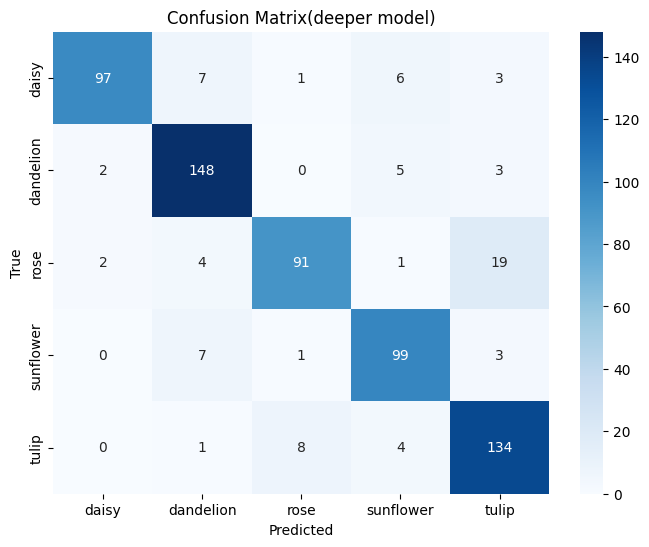

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(true_label, predicted_label)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix(deeper model)')
plt.show()

In [ ]:
# Get predictions from the fine-tuned model on the test set
predictions2 = model_fine_tuning.predict(test_gen_tl)
predicted_classes = np.argmax(predictions2, axis=1)

true_classes = test_gen_tl.classes
class_labels = list(test_gen_tl.class_indices.keys())

# Print true and predicted classes for each sample in the test set
for i in range(len(true_classes)):
    print(f"True class: {class_labels[true_classes[i]]}, Predicted class: {class_labels[predicted_classes[i]]}")

21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 178ms/step
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: tulip
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: dandelion
True class: daisy, Predicted class: daisy
True class: daisy, Predicted class: daisy
True class: daisy, Predicted cl

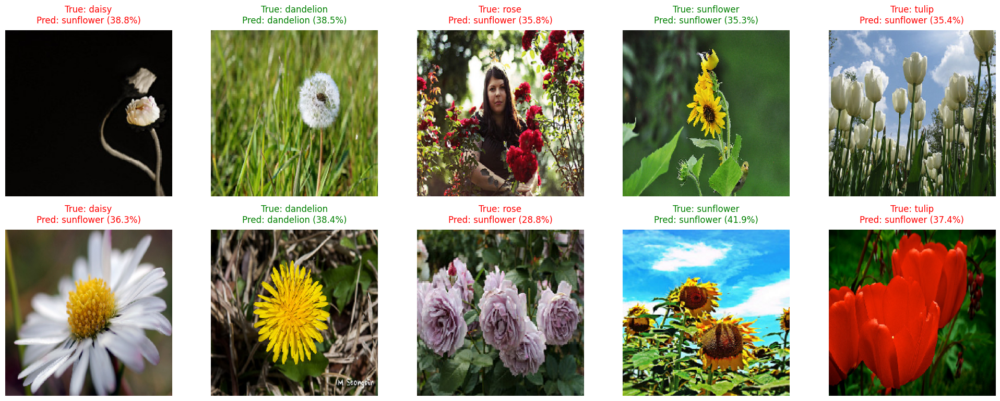

In [ ]:
# 1. Get class names and set up plot
class_names = sorted(os.listdir(test_gen_tl))
plt.figure(figsize=(20, 8))  # 2 rows, 5 columns layout

# 2. Process 2 random images per class
for class_idx, class_name in enumerate(class_names):
    class_path = os.path.join(test_dir, class_name)
    all_images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.png'))]

    # Randomly select 2 different images
    random_images = random.sample(all_images, min(2, len(all_images)))

    for img_idx, img_file in enumerate(random_images):
        # 3. Load and preprocess image
        img_path = os.path.join(class_path, img_file)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img) / 255.0

        # 4. Make prediction
        pred = model_fine_tuning.predict(np.expand_dims(img_array, axis=0), verbose=0)
        pred_class = class_names[np.argmax(pred)]
        confidence = np.max(pred) * 100

        # 5. Create subplot
        ax = plt.subplot(2, 5, img_idx*5 + class_idx + 1)
        plt.imshow(img)

        # Color title based on prediction correctness
        title_color = 'green' if pred_class == class_name else 'red'
        plt.title(f"True: {class_name}\nPred: {pred_class} ({confidence:.1f}%)",
                 color=title_color, pad=10)
        plt.axis('off')

plt.tight_layout(pad=2.0)
plt.show()

In [ ]:
# Replace these placeholders with your actual Part A results
baseline_accuracy = 0.7321
deeper_accuracy = 0.7383
baseline_time = 26.29
deeper_time = 28.08

print("\nModel Comparison Summary:")
print("------------------------")
print(f"Fine-tuned VGG16 Model Accuracy: {test_acc_ft:.4f}")
print(f"Feature Extraction VGG16 Model Accuracy: {feature_extraction_results[1]:.4f}")
print(f"Part A Baseline Model Accuracy: {baseline_accuracy:.4f}")
print(f"Part A Deeper Model Accuracy: {deeper_accuracy:.4f}")
print("\nTraining Time Comparison:")
print(f"Fine-tuning Training Time: {fine_tuning_time:.2f} seconds")
print(f"Feature Extraction Training Time: {feature_extraction_time:.2f} seconds")
print(f"Part A Baseline Training Time: {baseline_time:.2f} minutes")
print(f"Part A Deeper Model Training Time: {deeper_time:.2f} minutes")


Model Comparison Summary:
------------------------
Fine-tuned VGG16 Model Accuracy: 0.8808
Feature Extraction VGG16 Model Accuracy: 0.8607
Part A Baseline Model Accuracy: 0.7321
Part A Deeper Model Accuracy: 0.7383

Training Time Comparison:
Fine-tuning Training Time: 618.40 seconds
Feature Extraction Training Time: 942.32 seconds
Part A Baseline Training Time: 26.29 minutes
Part A Deeper Model Training Time: 28.08 minutes


**Discuss whether transfer learning outperforms training from scratch for your dataset.**

Because it uses ready-made models, transfer learning works well when only a small amount of data is provided for a new problem. The process of transfer learning doesn’t require lengthy training, as it can transfer learned features to a new problem, fast and efficiently. By diverging from the original frozen layers, fine-tuning allows the model to additionally adapt and perform better on the new task. Alternatively, starting from scratch requires using randomized weights as a starting point, which makes the process longer with bigger datasets and bigger risks when the data is not sufficient.

Sometimes, using transfer learning is better since it tends to give quicker results, learns better from experience, and saves costs for training. Efforts can be made easier if the second problem is the same as or similar to the problem the model was trained for. On the other hand, due to transfer learning, you do not have as much freedom in designing the model. Generally, transfer learning is used for small sets of data, whereas if data is abundant, training from the start is preferred.